# NGC 6121 Analysis

In [1]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
import glob
import re
from astropy.stats import sigma_clip
import numpy.ma as ma
import statsmodels.api as sm
%matplotlib inline 

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
target = 'NGC6121'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '16:23:35.22'
cluster_dec = '-26:31:32.7'
ebv = 0.35
red_law = [1.0, 0.066, 0.051] 
Rv = 3.1
feh = -1.1
mu = 11.39

## Cluster Snapshot

In [5]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

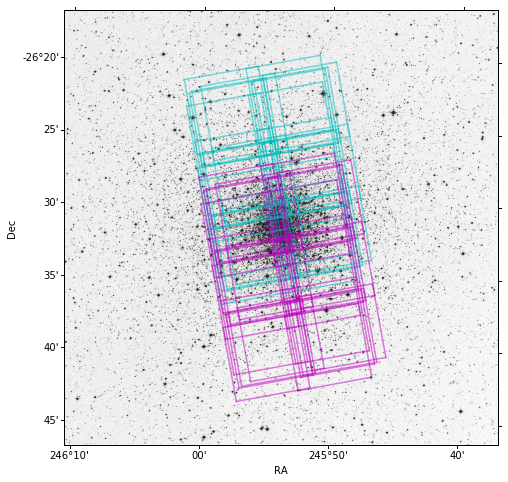

In [7]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.savefig(folder+target+'-map.pdf', format='pdf')

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC6121...
Finished reading optical catalog.


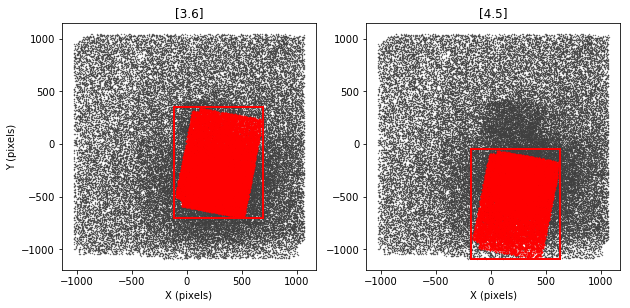

In [3]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'DeepMosaic/I1-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'DeepMosaic/I2-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymin']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymax'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmin']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmax'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('[3.6]')
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymin']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymax'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmin']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmax'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.set_xlabel('X (pixels)')
ax2.set_title('[4.5]')


# Add transformed catalogs
I1ids, I1x, I1y, I1mag, I1err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I1_deep_dn.alf')
I2ids, I2x, I2y, I2mag, I2err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I2_deep_dn.alf')

filesI1, x_offI1, y_offI1, transformI1, dofI1 = read_dao.read_mch(folder+'DeepMosaic/op-I1-deep.mch')
filesI2, x_offI2, y_offI2, transformI2, dofI2 = read_dao.read_mch(folder+'DeepMosaic/op-I2-deep.mch')

xI1 = float(x_offI1[1])+float(transformI1[1][0])*I1x+float(transformI1[1][1])*I1y
yI1 = float(y_offI1[1])+float(transformI1[1][2])*I1x+float(transformI1[1][3])*I1y
xI2 = float(x_offI2[1])+float(transformI2[1][0])*I2x+float(transformI2[1][1])*I2y
yI2 = float(y_offI2[1])+float(transformI2[1][2])*I2x+float(transformI2[1][3])*I2y

ax1.plot(xI1, yI1, '.', markersize=1.8, color='r')
ax2.plot(xI2, yI2, '.', markersize=1.8, color='r')


mp.show()

# Calibration

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder)
calibration.find_lst_stars(target, 'I2', data_dir=folder)

[80399] [80442 80540]
[80423] [80673]
[78171] [77959]
[69315] []
[66357] [66028 66004]
[73403] [72946 73655]
[75488] []
[73455] [73147 73250]
[71405] []
[69259] [69552 69281 69667]
[68541] [68342]
[65698] [65277]
[65090] [64787]
[65466] []
[65465] []
[67216] []
[64315] []
[47444] [48043 46942]
[62711] [62821 62266]
[62975] [62916]
[43315] []
[53950] [53422 54493]
[53879] [54338 53655]
[47521] [47459]
[49688] [50227]
[35144] [34628 34887]
[37592] [37304]
[79560] [79492]
[72521] [72764 72911 72344]
[68221] []
[76634] [76919 76756]
[70084] []
[68500] [68746]
[68277] [67824]
[66134] []
[66682] []
[66734] []
[63491] [63768 63138]
[66692] [66993 66293]
[66357] [66028 66004]
[62380] [61837]
[66482] [66526]
[72210] [72520 72129]
[59599] [59192]
[62061] [61637]
[59961] [59439 60221 59860]
[55042] [55540]
[63713] [64032 63658 63327 63488 63214 63364]
[58186] []
[53510] []
[53064] [52944]
[48219] [48587]
[53484] [54053 53772 52933]
[47444] [48043 46942]
[45569] [46134 46012 45795]
[42649] [42128]

In [9]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/')
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/')


  READ NOISE (ADU; 1 frame) =     3.95        GAIN (e-/ADU; 1 frame) =     3.70
 LOW GOOD DATUM (in sigmas) =    10.00      HIGH GOOD DATUM (in ADU) = 30000.00
             FWHM OF OBJECT =     2.00         THRESHOLD (in sigmas) =     6.00
  LS (LOW SHARPNESS CUTOFF) =     0.30    HS (HIGH SHARPNESS CUTOFF) =     1.40
  LR (LOW ROUNDNESS CUTOFF) =    -1.00    HR (HIGH ROUNDNESS CUTOFF) =     1.00
             WATCH PROGRESS =    -1.00                FITTING RADIUS =     2.00
                 PSF RADIUS =     9.00                  VARIABLE PSF =     0.00
              SKY ESTIMATOR =     0.00            ANALYTIC MODEL PSF =     2.00
  EXTRA PSF CLEANING PASSES =     5.00       USE SATURATED PSF STARS =     0.00
       PERCENT ERROR (in %) =     0.75          PROFILE ERROR (in %) =     5.00

 Command: at NGC6121:I1_46731520_01.fits
at NGC6121:I1_46731520_01.fits

     NGC6121:I1_46731520_01...               


                                      Picture size:    256   256


 Command: 

 PHO> 


 Input position file (default 
                       NGC6121:I1_46731520_08.coo): 

   Output file (default NGC6121:I1_46731520_08.ap): 


 Command: at NGC6121:I1_46731520_09.fits
at NGC6121:I1_46731520_09.fits

     NGC6121:I1_46731520_09...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46731520_25.coo): 

   Output file (default NGC6121:I1_46731520_25.ap): 


 Command: at NGC6121:I1_46731520_26.fits
at NGC6121:I1_46731520_26.fits

     NGC6121:I1_46731520_26...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46732544_12.coo): 

   Output file (default NGC6121:I1_46732544_12.ap): 


 Command: at NGC6121:I1_46732544_13.fits
at NGC6121:I1_46732544_13.fits

     NGC6121:I1_46732544_13...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46732544_29.coo): 

   Output file (default NGC6121:I1_46732544_29.ap): 


 Command: at NGC6121:I1_46732544_30.fits
at NGC6121:I1_46732544_30.fits

     NGC6121:I1_46732544_30...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46733568_16.coo): 

   Output file (default NGC6121:I1_46733568_16.ap): 


 Command: at NGC6121:I1_46733568_17.fits
at NGC6121:I1_46733568_17.fits

     NGC6121:I1_46733568_17...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46772736_03.coo): 

   Output file (default NGC6121:I1_46772736_03.ap): 


 Command: at NGC6121:I1_46772736_04.fits
at NGC6121:I1_46772736_04.fits

     NGC6121:I1_46772736_04...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46772736_20.coo): 

   Output file (default NGC6121:I1_46772736_20.ap): 


 Command: at NGC6121:I1_46772736_21.fits
at NGC6121:I1_46772736_21.fits

     NGC6121:I1_46772736_21...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46772992_07.coo): 

   Output file (default NGC6121:I1_46772992_07.ap): 


 Command: at NGC6121:I1_46772992_08.fits
at NGC6121:I1_46772992_08.fits

     NGC6121:I1_46772992_08...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46772992_24.coo): 

   Output file (default NGC6121:I1_46772992_24.ap): 


 Command: at NGC6121:I1_46772992_25.fits
at NGC6121:I1_46772992_25.fits

     NGC6121:I1_46772992_25...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46773248_11.coo): 

   Output file (default NGC6121:I1_46773248_11.ap): 


 Command: at NGC6121:I1_46773248_12.fits
at NGC6121:I1_46773248_12.fits

     NGC6121:I1_46773248_12...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46773248_28.coo): 

   Output file (default NGC6121:I1_46773248_28.ap): 


 Command: at NGC6121:I1_46773248_29.fits
at NGC6121:I1_46773248_29.fits

     NGC6121:I1_46773248_29...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46773504_15.coo): 

   Output file (default NGC6121:I1_46773504_15.ap): 


 Command: at NGC6121:I1_46773504_16.fits
at NGC6121:I1_46773504_16.fits

     NGC6121:I1_46773504_16...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46773760_02.coo): 

   Output file (default NGC6121:I1_46773760_02.ap): 


 Command: at NGC6121:I1_46773760_03.fits
at NGC6121:I1_46773760_03.fits

     NGC6121:I1_46773760_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46773760_19.coo): 

   Output file (default NGC6121:I1_46773760_19.ap): 


 Command: at NGC6121:I1_46773760_20.fits
at NGC6121:I1_46773760_20.fits

     NGC6121:I1_46773760_20...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46774272_06.coo): 

   Output file (default NGC6121:I1_46774272_06.ap): 


 Command: at NGC6121:I1_46774272_07.fits
at NGC6121:I1_46774272_07.fits

     NGC6121:I1_46774272_07...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46774272_23.coo): 

   Output file (default NGC6121:I1_46774272_23.ap): 


 Command: at NGC6121:I1_46774272_24.fits
at NGC6121:I1_46774272_24.fits

     NGC6121:I1_46774272_24...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46774784_10.coo): 

   Output file (default NGC6121:I1_46774784_10.ap): 


 Command: at NGC6121:I1_46774784_11.fits
at NGC6121:I1_46774784_11.fits

     NGC6121:I1_46774784_11...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46774784_27.coo): 

   Output file (default NGC6121:I1_46774784_27.ap): 


 Command: at NGC6121:I1_46774784_28.fits
at NGC6121:I1_46774784_28.fits

     NGC6121:I1_46774784_28...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46775296_14.coo): 

   Output file (default NGC6121:I1_46775296_14.ap): 


 Command: at NGC6121:I1_46775296_15.fits
at NGC6121:I1_46775296_15.fits

     NGC6121:I1_46775296_15...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46775808_01.coo): 

   Output file (default NGC6121:I1_46775808_01.ap): 


 Command: at NGC6121:I1_46775808_02.fits
at NGC6121:I1_46775808_02.fits

     NGC6121:I1_46775808_02...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I1_46775808_18.coo): 

   Output file (default NGC6121:I1_46775808_18.ap): 


 Command: at NGC6121:I1_46775808_19.fits
at NGC6121:I1_46775808_19.fits

     NGC6121:I1_46775808_19...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

                       NGC6121:I2_46731520_02.coo): 

   Output file (default NGC6121:I2_46731520_02.ap): 


 Command: at NGC6121:I2_46731520_03.fits
at NGC6121:I2_46731520_03.fits

     NGC6121:I2_46731520_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position file (default 
                       NGC

 PHO> 


 Input position file (default 
                       NGC6121:I2_46731520_11.coo): 

   Output file (default NGC6121:I2_46731520_11.ap): 


 Command: at NGC6121:I2_46731520_12.fits
at NGC6121:I2_46731520_12.fits

     NGC6121:I2_46731520_12...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46731520_28.coo): 

   Output file (default NGC6121:I2_46731520_28.ap): 


 Command: at NGC6121:I2_46731520_29.fits
at NGC6121:I2_46731520_29.fits

     NGC6121:I2_46731520_29...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46732544_15.coo): 

   Output file (default NGC6121:I2_46732544_15.ap): 


 Command: at NGC6121:I2_46732544_16.fits
at NGC6121:I2_46732544_16.fits

     NGC6121:I2_46732544_16...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46733568_02.coo): 

   Output file (default NGC6121:I2_46733568_02.ap): 


 Command: at NGC6121:I2_46733568_03.fits
at NGC6121:I2_46733568_03.fits

     NGC6121:I2_46733568_03...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46733568_19.coo): 

   Output file (default NGC6121:I2_46733568_19.ap): 


 Command: at NGC6121:I2_46733568_20.fits
at NGC6121:I2_46733568_20.fits

     NGC6121:I2_46733568_20...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46772736_06.coo): 

   Output file (default NGC6121:I2_46772736_06.ap): 


 Command: at NGC6121:I2_46772736_07.fits
at NGC6121:I2_46772736_07.fits

     NGC6121:I2_46772736_07...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46772736_23.coo): 

   Output file (default NGC6121:I2_46772736_23.ap): 


 Command: at NGC6121:I2_46772736_24.fits
at NGC6121:I2_46772736_24.fits

     NGC6121:I2_46772736_24...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46772992_10.coo): 

   Output file (default NGC6121:I2_46772992_10.ap): 


 Command: at NGC6121:I2_46772992_11.fits
at NGC6121:I2_46772992_11.fits

     NGC6121:I2_46772992_11...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46772992_27.coo): 

   Output file (default NGC6121:I2_46772992_27.ap): 


 Command: at NGC6121:I2_46772992_28.fits
at NGC6121:I2_46772992_28.fits

     NGC6121:I2_46772992_28...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46773248_14.coo): 

   Output file (default NGC6121:I2_46773248_14.ap): 


 Command: at NGC6121:I2_46773248_15.fits
at NGC6121:I2_46773248_15.fits

     NGC6121:I2_46773248_15...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46773504_01.coo): 

   Output file (default NGC6121:I2_46773504_01.ap): 


 Command: at NGC6121:I2_46773504_02.fits
at NGC6121:I2_46773504_02.fits

     NGC6121:I2_46773504_02...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46773504_18.coo): 

   Output file (default NGC6121:I2_46773504_18.ap): 


 Command: at NGC6121:I2_46773504_19.fits
at NGC6121:I2_46773504_19.fits

     NGC6121:I2_46773504_19...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46773760_05.coo): 

   Output file (default NGC6121:I2_46773760_05.ap): 


 Command: at NGC6121:I2_46773760_06.fits
at NGC6121:I2_46773760_06.fits

     NGC6121:I2_46773760_06...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46773760_22.coo): 

   Output file (default NGC6121:I2_46773760_22.ap): 


 Command: at NGC6121:I2_46773760_23.fits
at NGC6121:I2_46773760_23.fits

     NGC6121:I2_46773760_23...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46774272_09.coo): 

   Output file (default NGC6121:I2_46774272_09.ap): 


 Command: at NGC6121:I2_46774272_10.fits
at NGC6121:I2_46774272_10.fits

     NGC6121:I2_46774272_10...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46774272_26.coo): 

   Output file (default NGC6121:I2_46774272_26.ap): 


 Command: at NGC6121:I2_46774272_27.fits
at NGC6121:I2_46774272_27.fits

     NGC6121:I2_46774272_27...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46774784_13.coo): 

   Output file (default NGC6121:I2_46774784_13.ap): 


 Command: at NGC6121:I2_46774784_14.fits
at NGC6121:I2_46774784_14.fits

     NGC6121:I2_46774784_14...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46774784_30.coo): 

   Output file (default NGC6121:I2_46774784_30.ap): 


 Command: at NGC6121:I2_46775296_01.fits
at NGC6121:I2_46775296_01.fits

     NGC6121:I2_46775296_01...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46775296_17.coo): 

   Output file (default NGC6121:I2_46775296_17.ap): 


 Command: at NGC6121:I2_46775296_18.fits
at NGC6121:I2_46775296_18.fits

     NGC6121:I2_46775296_18...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46775808_04.coo): 

   Output file (default NGC6121:I2_46775808_04.ap): 


 Command: at NGC6121:I2_46775808_05.fits
at NGC6121:I2_46775808_05.fits

     NGC6121:I2_46775808_05...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

 PHO> 


 Input position file (default 
                       NGC6121:I2_46775808_21.coo): 

   Output file (default NGC6121:I2_46775808_21.ap): 


 Command: at NGC6121:I2_46775808_22.fits
at NGC6121:I2_46775808_22.fits

     NGC6121:I2_46775808_22...               


                                      Picture size:    256   256


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     3.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     3.00     OS       OUTER SKY RADIUS =     7.00

 PHO> 


 Input position f

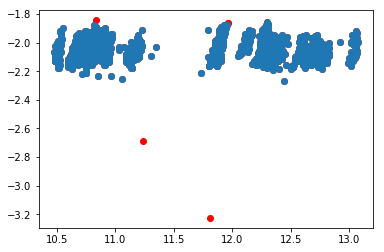

-2.06924311377 0.083133732879
-2.05633512867 0.0683944027791
There are 26 psf stars.


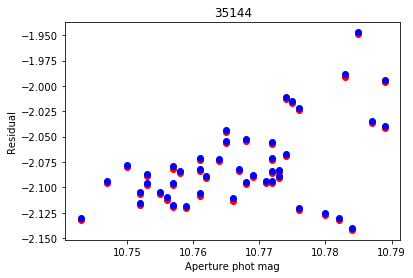

0.046 0.192
0.0115314356245 0.036046919907


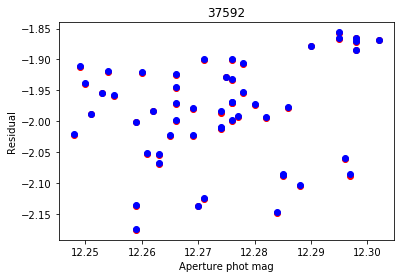

0.054 0.282
0.0143718852554 0.0791172775683


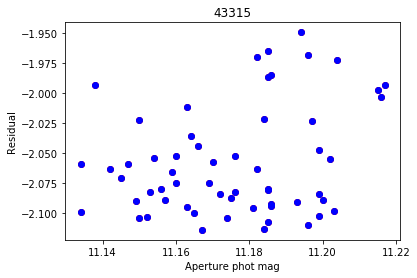

0.083 0.175
0.021156064675 0.0439406961714


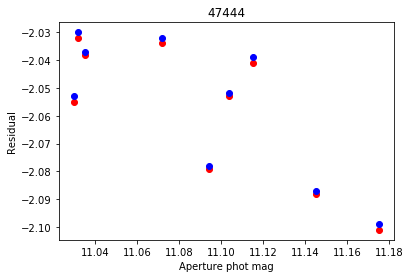

0.145 0.212
0.0487543603621 0.0690267437884


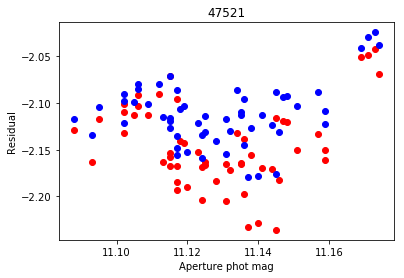

0.086 0.135
0.0206276232992 0.0337028826292


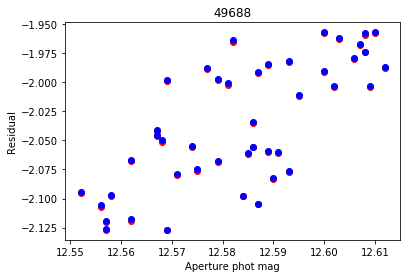

0.06 0.15
0.016884329377 0.0426547438091


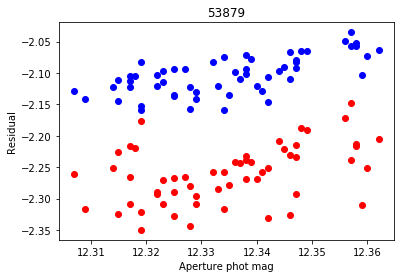

0.055 0.101
0.0144664350255 0.0235148061802


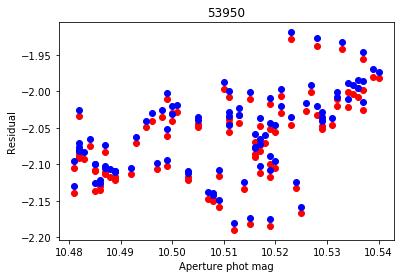

0.059 0.252
0.0174481868507 0.0502437162731


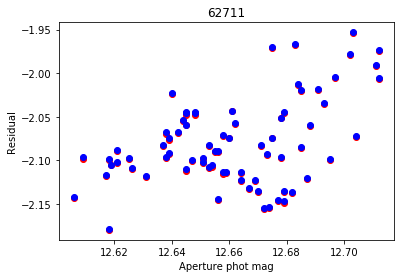

0.106 0.183
0.0259405822159 0.044081671413


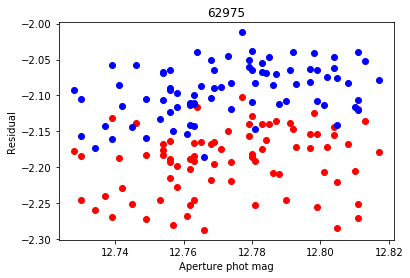

0.089 0.162
0.0229132057993 0.0347809911266


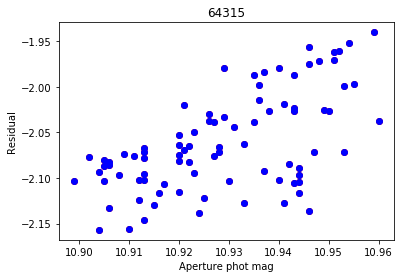

0.061 0.183
0.0160365995675 0.0454075767462


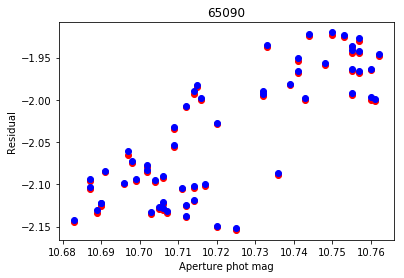

0.079 0.211
0.0239354065369 0.0572071070022


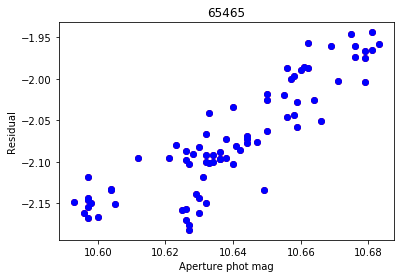

0.09 0.19
0.0241129572217 0.0469026852228


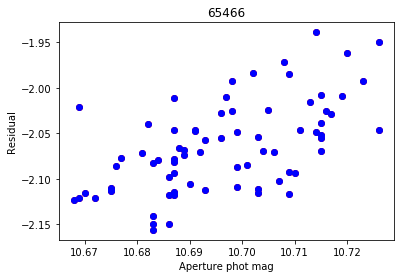

0.058 0.186
0.0150952478748 0.0417579900107


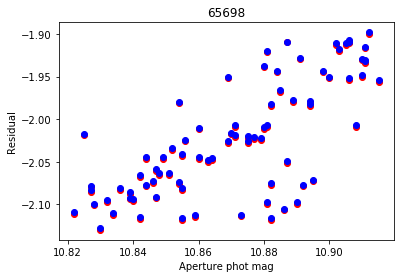

0.093 0.202
0.0260404013026 0.0512509618812


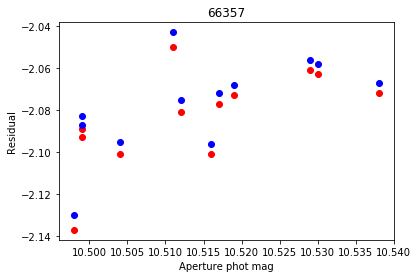

0.04 0.074
0.0126249312429 0.0173629554576


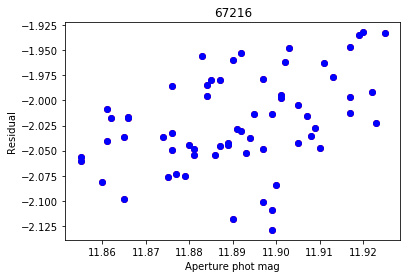

0.07 0.189
0.0181654653356 0.0423374620562


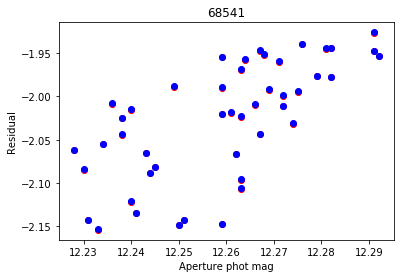

0.064 0.193
0.0174803832802 0.0563249920186


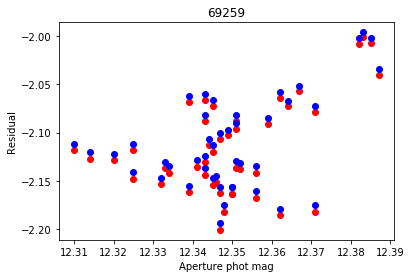

0.077 0.167
0.0172369695664 0.0423225695899


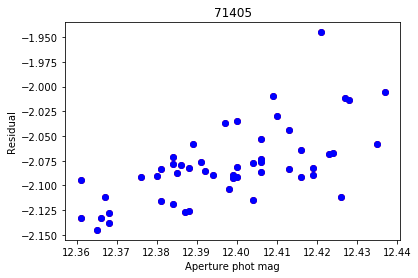

0.076 0.172
0.0197257359752 0.0295137867694


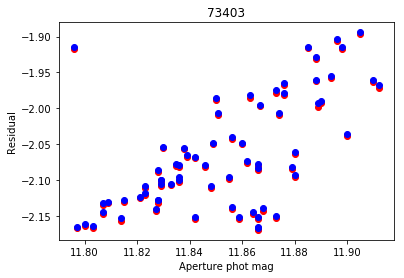

0.116 0.321
0.0295498681384 0.0628246510375


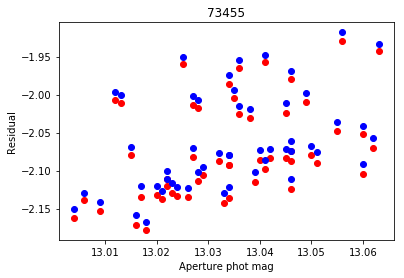

0.059 0.211
0.0148194633534 0.0576045999971


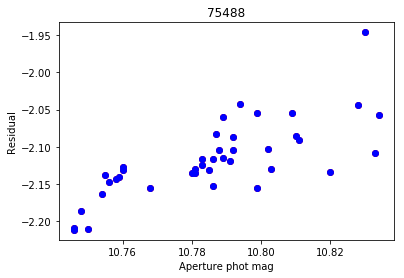

0.088 0.185
0.0246370528879 0.0357140641065


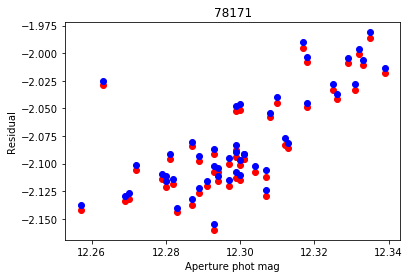

0.082 0.16
0.0192174504032 0.0330709298327


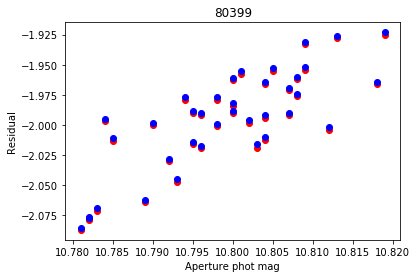

0.038 0.127
0.00997396171763 0.033621730251


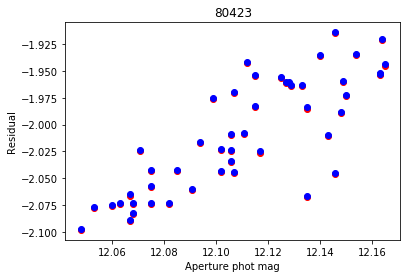

0.117 0.147
0.0330043925949 0.0316473625371


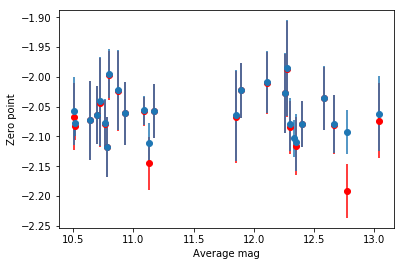

-2.06590281173 0.0444560813452
-2.06009484802 0.0343507116087


In [10]:
I1zp, I1zper = calibration.find_zp_bcds('I1', data_dir=folder)

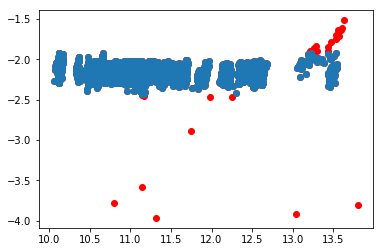

-2.17547866483 0.0883443241343
-2.17083579088 0.0882220828591
There are 51 psf stars.


calibration.py:338: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 613439 but corresponding boolean dimension is 3013


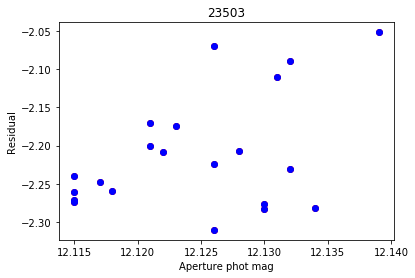

0.024 0.245
0.00699368033483 0.070540414752


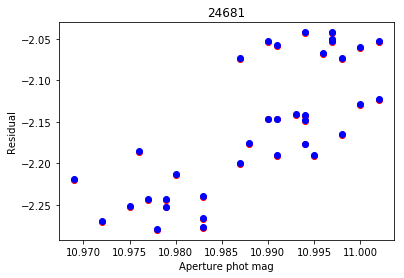

0.033 0.224
0.00892181402138 0.0716814368931


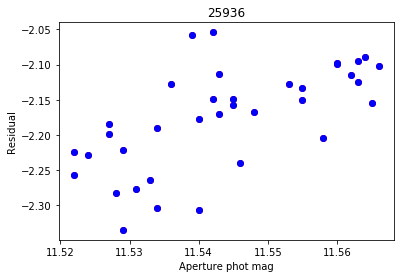

0.044 0.268
0.0136357769702 0.0643223160303


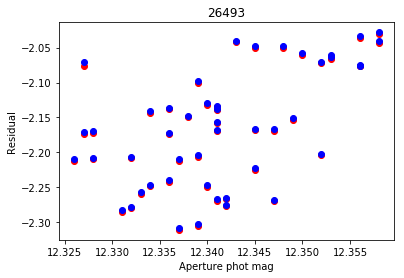

0.032 0.262
0.00875158913332 0.0780397630537


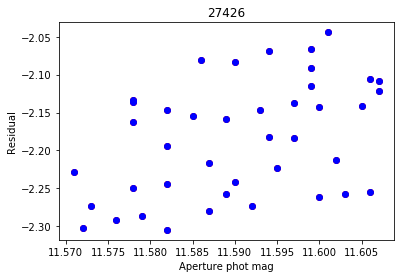

0.036 0.242
0.0105162405209 0.0705932370415


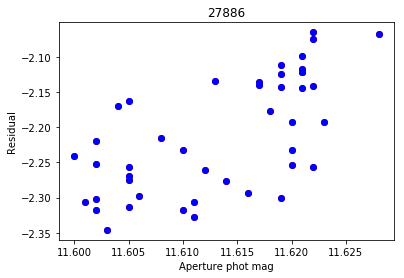

0.028 0.262
0.00786639468176 0.0761657711185


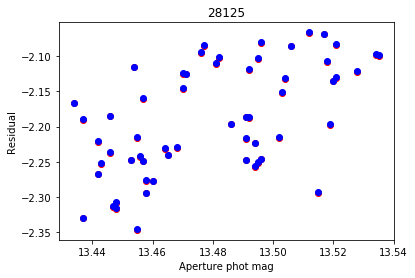

0.101 0.247
0.0282248119904 0.0651035943891


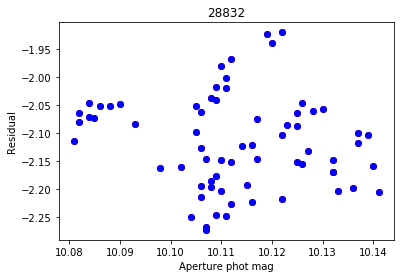

0.06 0.338
0.0153616931895 0.0859614110334


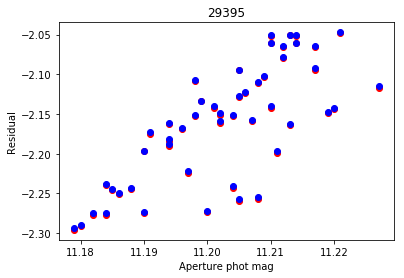

0.048 0.212
0.0117396085538 0.0653141257851


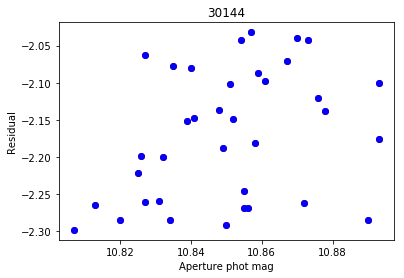

0.086 0.286
0.0215551975915 0.0816738611721


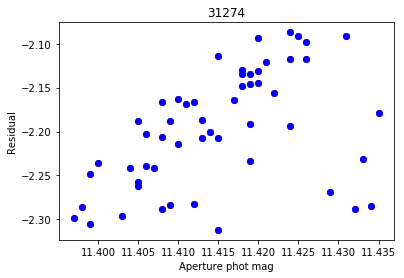

0.038 0.216
0.00973632134642 0.0614552738654


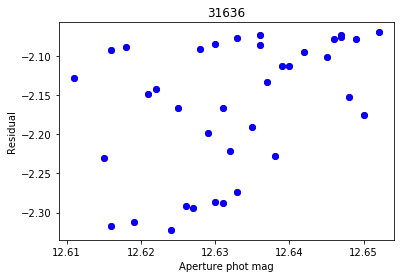

0.041 0.239
0.0109386361979 0.0797076469648


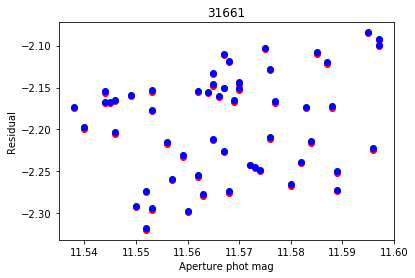

0.059 0.193
0.0155285479833 0.0589861327313


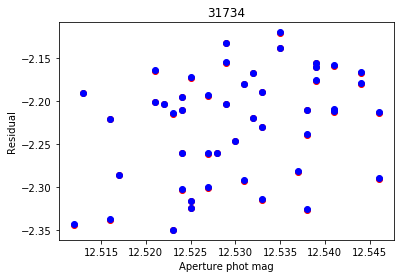

0.034 0.218
0.00864578313238 0.0594820818025


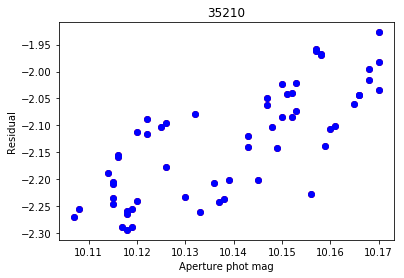

0.063 0.315
0.0192030382782 0.086578321784


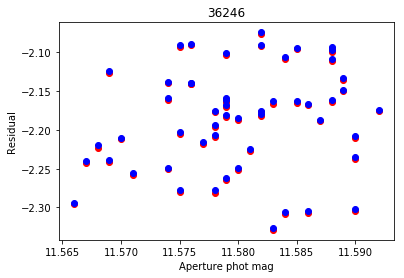

0.026 0.253
0.00657887489421 0.06450711337


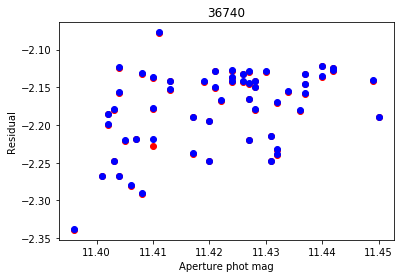

0.054 0.246
0.0134400851175 0.0482543532755


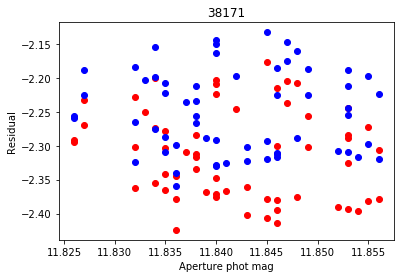

0.03 0.218
0.00809719043631 0.0613987864201


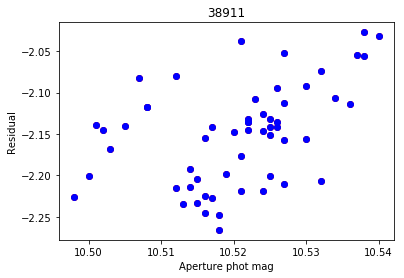

0.042 0.226
0.00996636386759 0.0562004776703


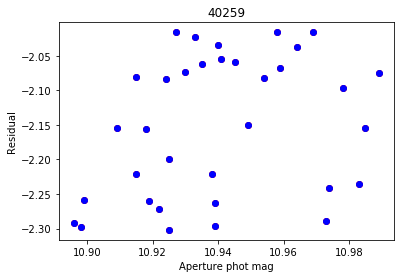

0.093 0.319
0.0255892663754 0.0955903393434


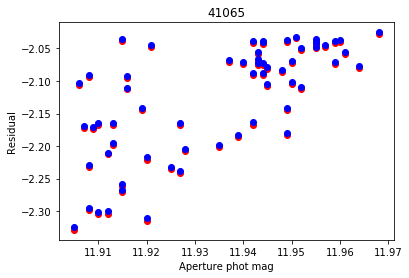

0.063 0.28
0.0184816259966 0.0736257798808


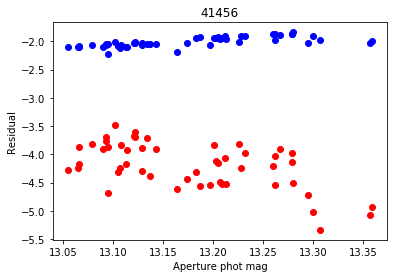

0.304 0.285
0.0805972419947 0.0652705898846


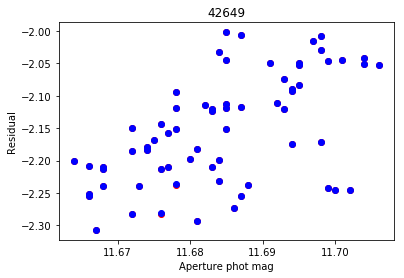

0.042 0.287
0.0110650053518 0.0777876205565


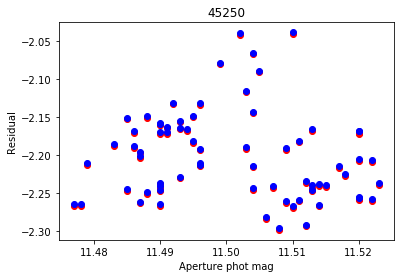

0.046 0.263
0.0125863036217 0.0610843965974


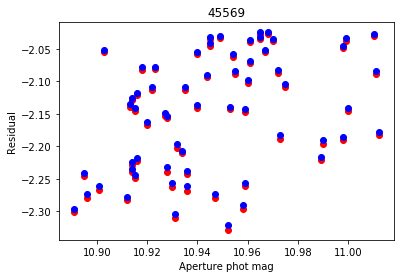

0.121 0.32
0.0309172176891 0.0816317140122


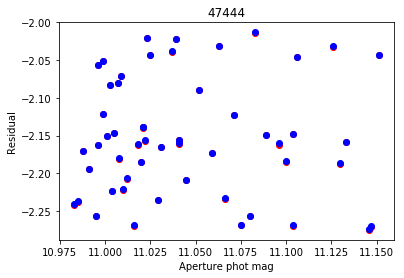

0.168 0.376
0.0477329777643 0.0912011340358


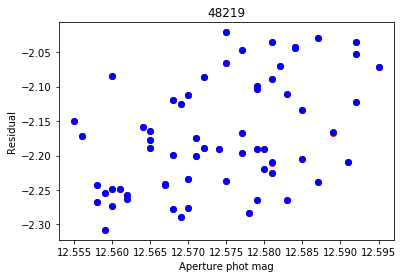

0.04 0.271
0.0103217573469 0.0756948396045


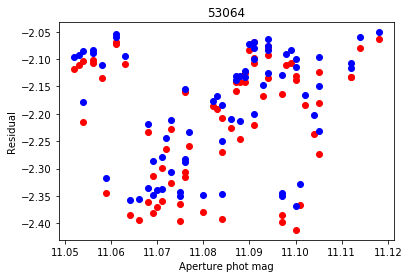

0.066 0.353
0.0167321272298 0.100692848782


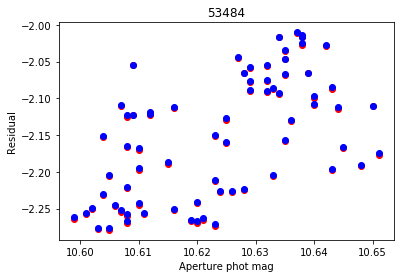

0.052 0.247
0.0141467778363 0.0752721334136


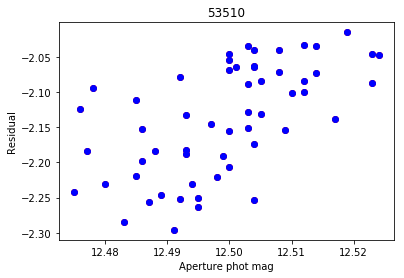

0.049 0.253
0.0120880986967 0.0713472304713


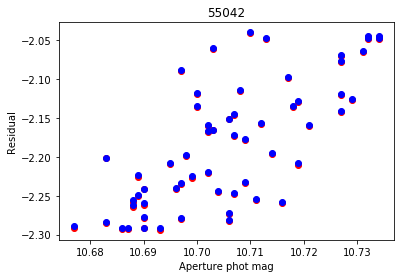

0.057 0.237
0.0147170966249 0.0698351857904


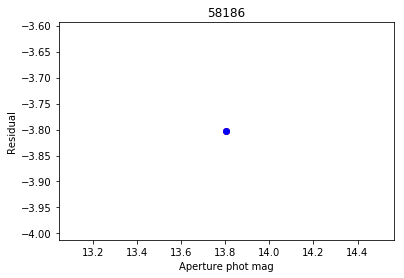

0.0 0.0
0.0 0.0


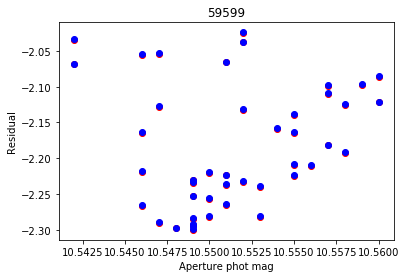

0.018 0.272
0.00447952181627 0.0835248855627


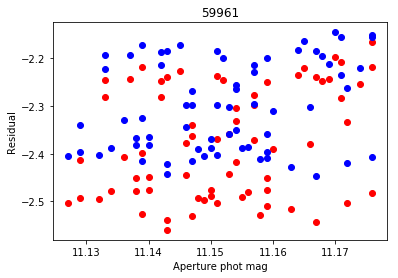

0.049 0.304
0.0130402209181 0.0913579917452


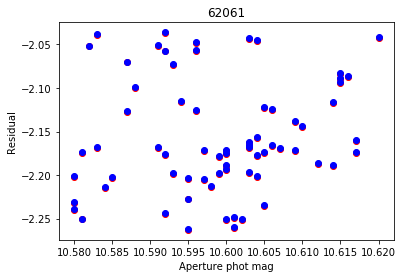

0.04 0.24
0.0103732080214 0.063641950289


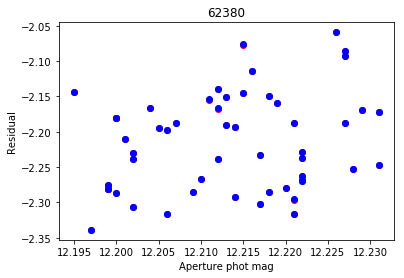

0.036 0.252
0.00995440790235 0.0668157710673


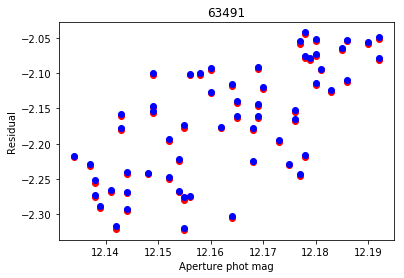

0.058 0.254
0.0160040272709 0.0697227525434


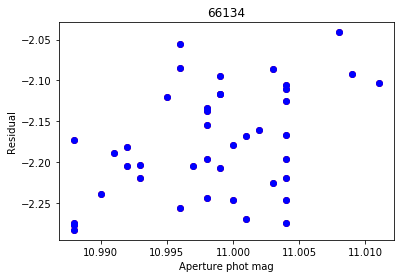

0.023 0.23
0.00581132875942 0.0631301834943


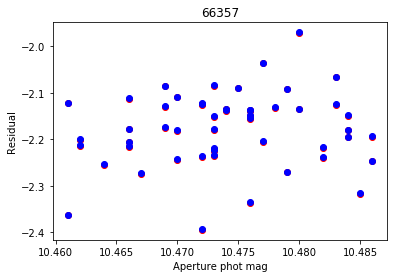

0.025 0.415
0.00679088427149 0.078907861433


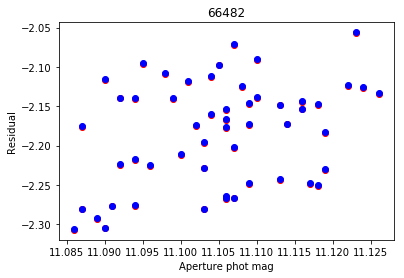

0.04 0.216
0.0104664103597 0.0623939413404


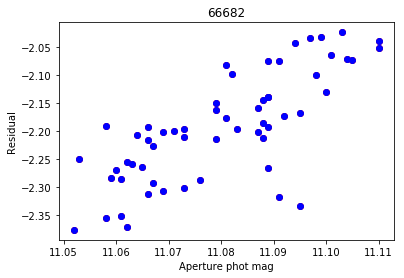

0.058 0.307
0.0155160535944 0.0842068541896


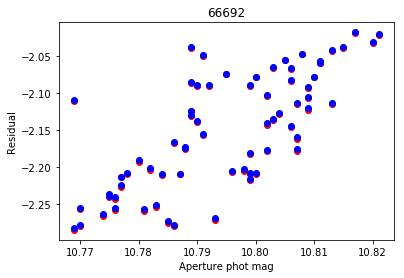

0.052 0.237
0.0136709033577 0.0676459510779


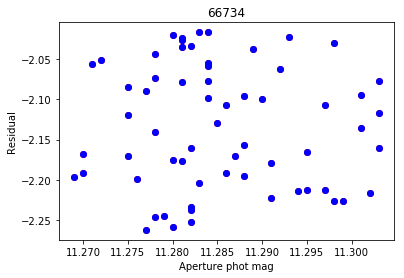

0.034 0.239
0.00904210358203 0.076059265325


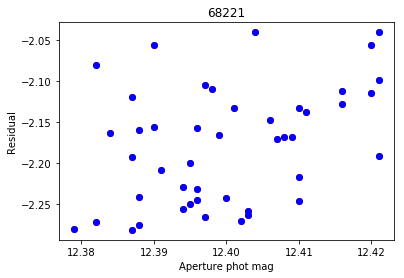

0.042 0.229
0.0116265766221 0.0669007224674


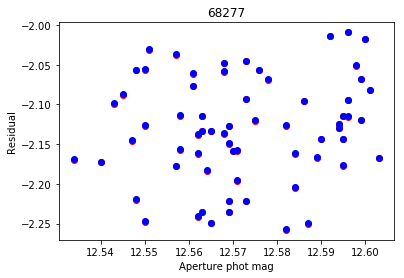

0.069 0.258
0.0177881284792 0.0644957060173


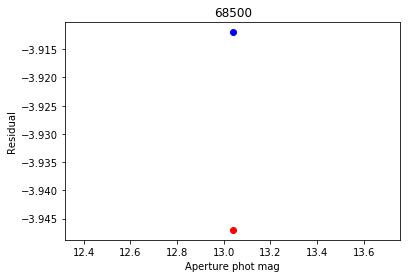

0.0 0.0
0.0 0.0


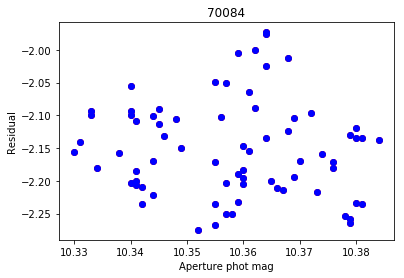

0.054 0.307
0.0145570132858 0.0757404078085


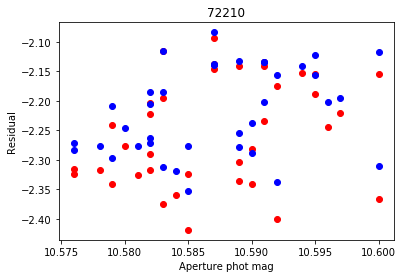

0.024 0.267
0.00641947366024 0.0712318101805


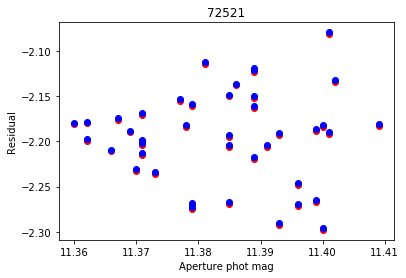

0.049 0.216
0.012747059596 0.0510491071212


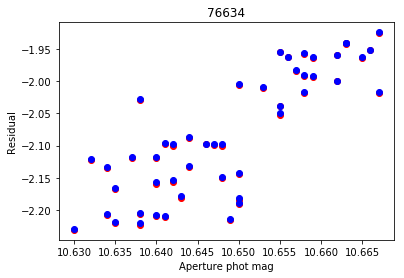

0.037 0.272
0.0103829454181 0.0871463662427


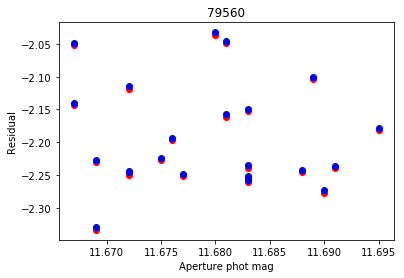

0.028 0.287
0.00808439472172 0.0803033633498


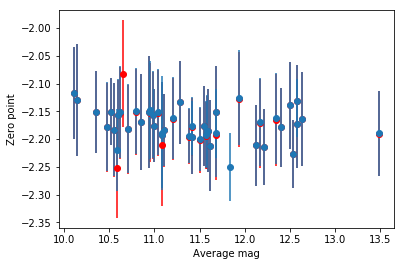

-2.17172906704 0.0307166154281
-2.17333602105 0.0280139759456


In [11]:
I2zp, I2zper = calibration.find_zp_bcds('I2', data_dir=folder)

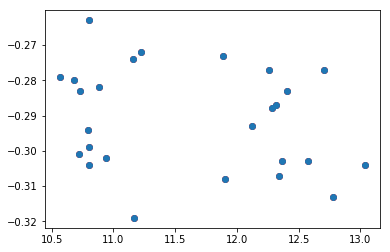

-0.289086956522 0.0131675260741
-0.291076923077 0.0143926345397
There are 27 psf stars.


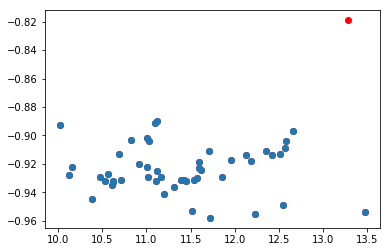

-0.92447826087 0.0163849601377
-0.923897959184 0.0162709769133
There are 52 psf stars.


In [12]:
I1_mosaic_zp, I1_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I1', data_dir=folder)
I2_mosaic_zp, I2_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I2', data_dir=folder)

In [13]:
calibration.apply_calibration_bcds(target, 'I1', -2.072, data_dir=folder)
calibration.apply_calibration_bcds(target, 'I2', -2.182, data_dir=folder)


NameError: global name 'alf' is not defined

In [3]:
calibration.apply_calibration_deep_mosaic(target, 'I1', -0.29, data_dir=folder)
calibration.apply_calibration_deep_mosaic(target, 'I2', -0.92, data_dir=folder)

## MIR catalog

In [4]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

Reading optical catalog for NGC6121...
Finished reading optical catalog.
Reading MIR catalog for NGC6121...


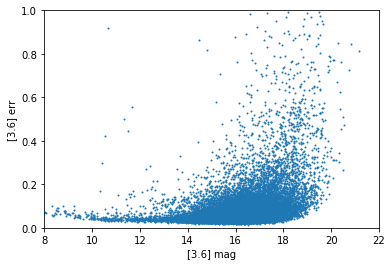

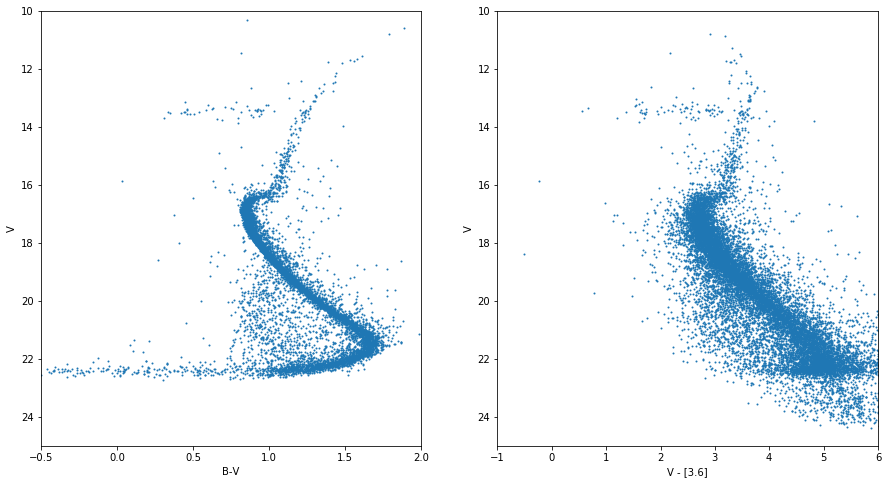

In [8]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorBV = catalog_data['B'][(dist > thres2) & (dist < thres)] - catalog_data['V'][(dist > thres2) & (dist < thres)]
Vmag = catalog_data['V'][(dist > thres2) & (dist < thres)]
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(magIR, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((8,22))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(121)
ax2.scatter(colorBV, Vmag, s=1, edgecolor=None)
ax2.set_ylim((25,10))
ax2.set_xlim((-0.5,2))
ax2.set_xlabel('B-V')
ax2.set_ylabel('V')
ax3 = fig2.add_subplot(122)
ax3.scatter(good_color, good_mag, s=1, edgecolor=None)
ax3.set_ylim((25,10))
ax3.set_xlim((-1,6))
ax3.set_xlabel('V - [3.6]')
ax3.set_ylabel('V')
mp.savefig(folder+target+'cmd.eps', format='eps')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

## First check on RRL PL relation

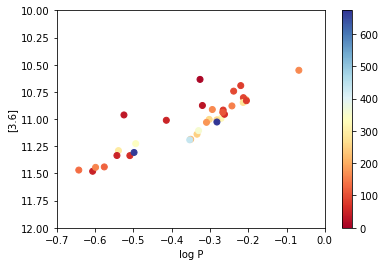

In [7]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

mag = np.zeros(len(data['id']))
dist = np.zeros(len(data['id']))

for ind, star in enumerate(data['id']):
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    if len(dao_id) == 0: continue
    m = catalog_data['3.6'][catalog_data['id'] == dao_id]  
    d = catalog_data['rad_dist'][catalog_data['id'] == dao_id]
    if m < 50: 
        mag[ind] = m
        dist[ind] = d
    if m > 50: 
        mag[ind] = np.nan
        dist[ind] = np.nan
cm = mp.cm.get_cmap('RdYlBu')    
mp.scatter(np.log10(data['new_period']), mag, c=dist, cmap=cm) 
mp.colorbar()
mp.ylim((12, 10))
mp.xlim((-0.7, 0))
mp.xlabel('log P')
mp.ylabel('[3.6]')
mp.savefig(target+'pl.eps', format='eps')

##  Generate MIR light curves matching optical ID numbers  

In [9]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

#### Phase MIR light curves

In [10]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
    except:
        print lcv +' not found.'

V30 not found.
V31 not found.
V32 not found.
V33 not found.
V34 not found.
V35 not found.
V43 not found.
V64 not found.
V75 not found.
V76 not found.


#### Create figure with all bands phased together

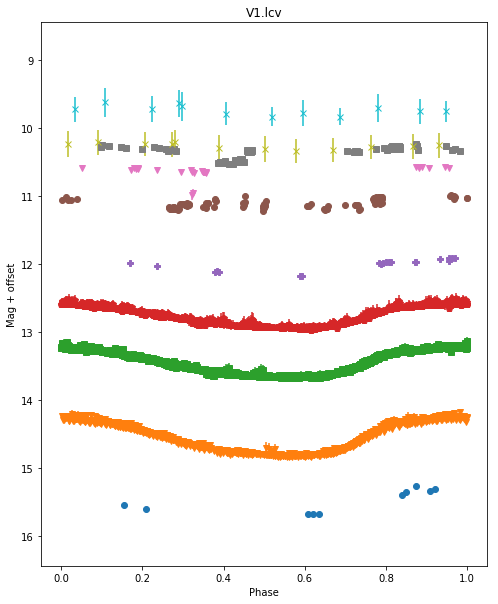

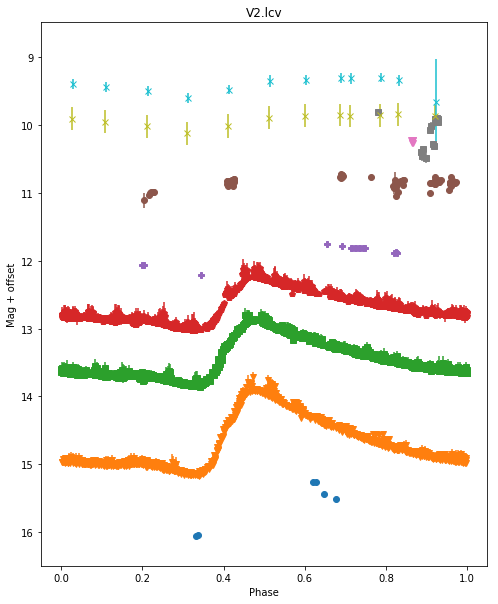

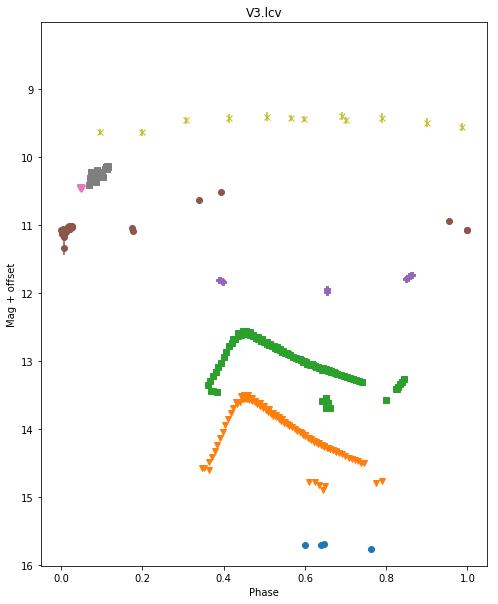

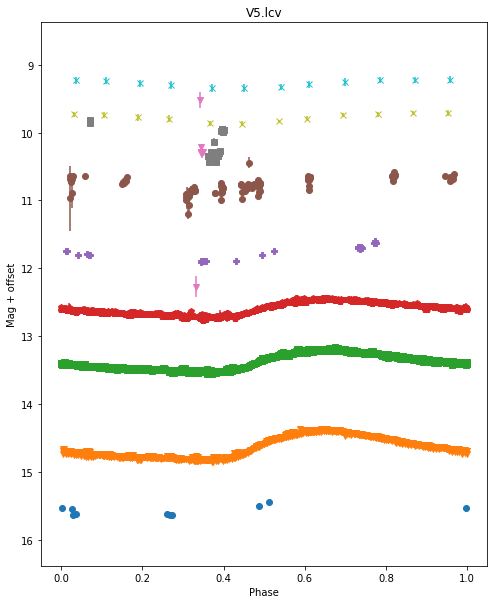

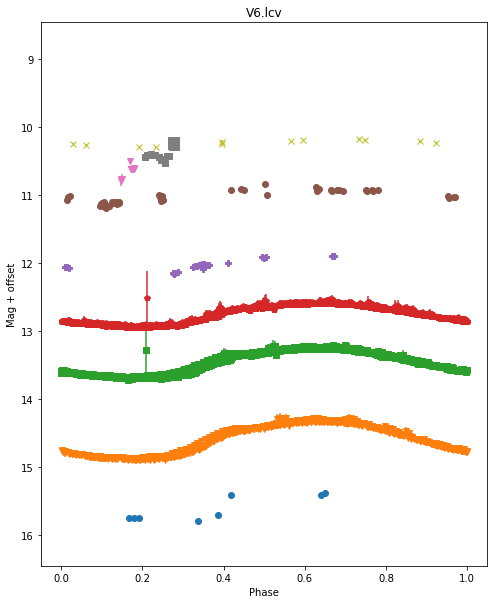

...

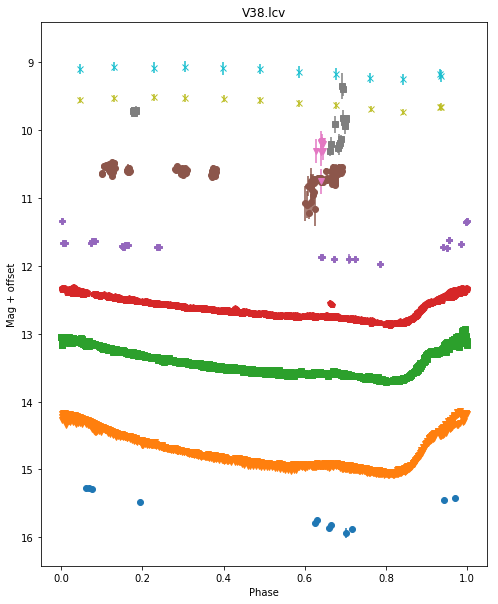

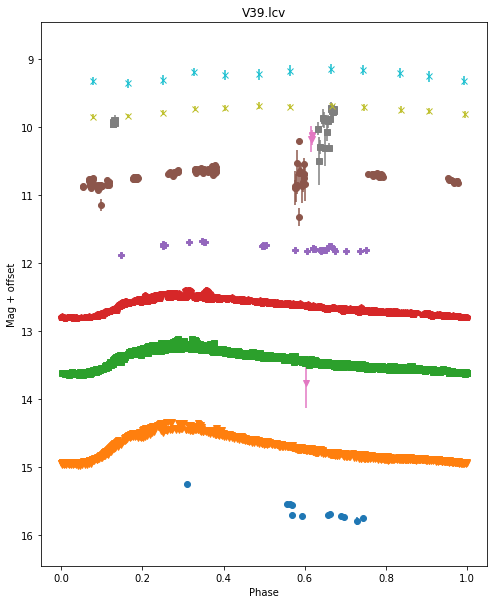

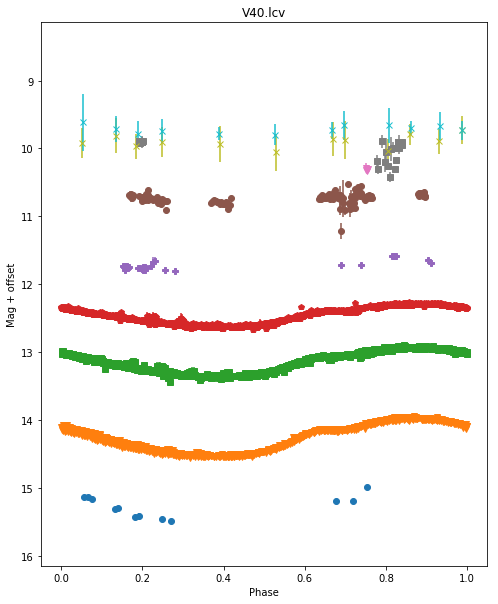

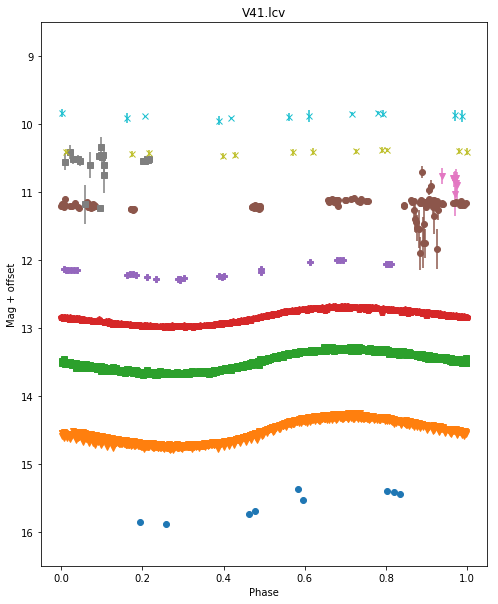

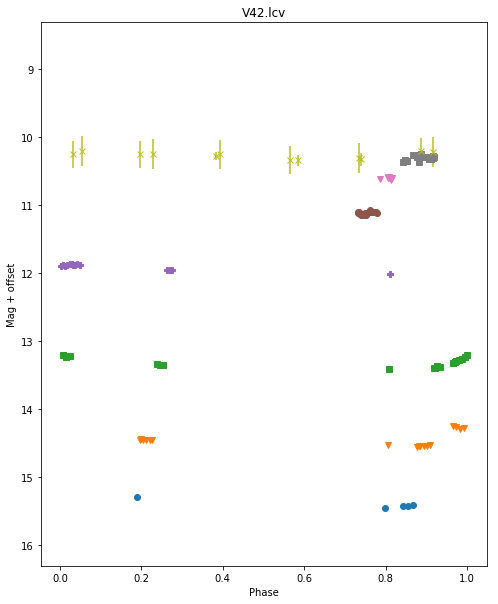

V43  not found.


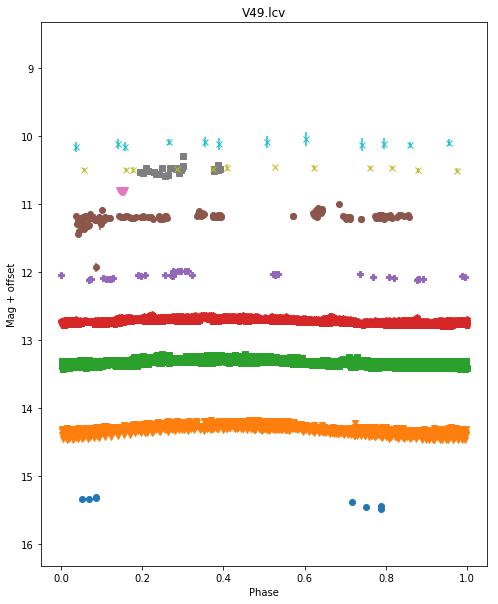

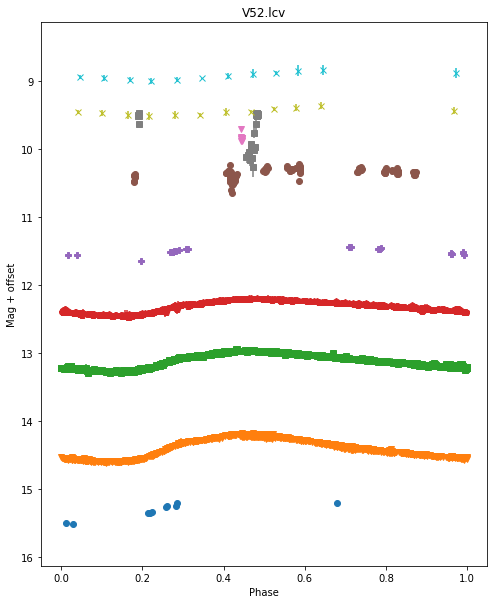

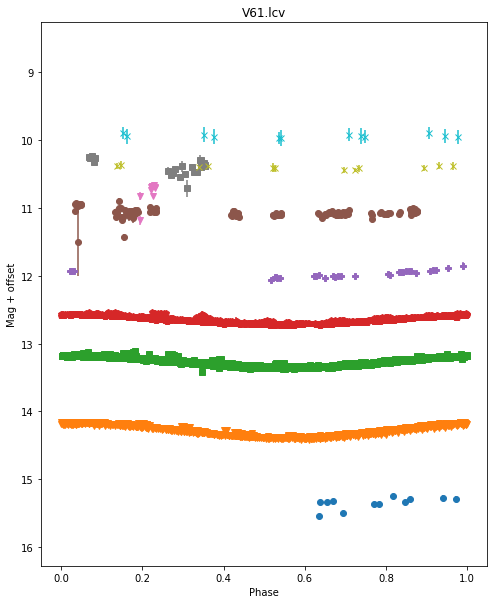

V64  not found.


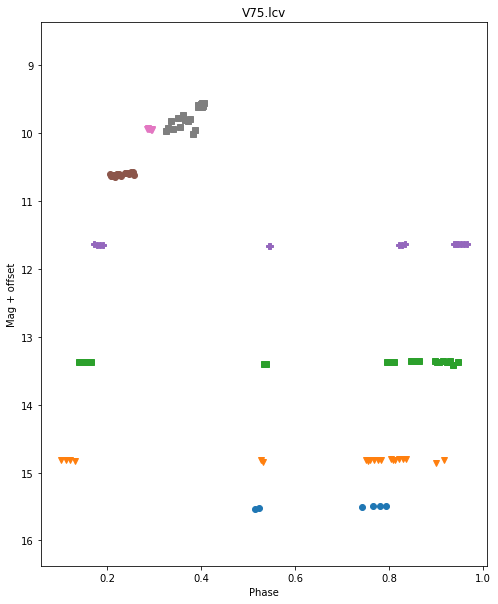

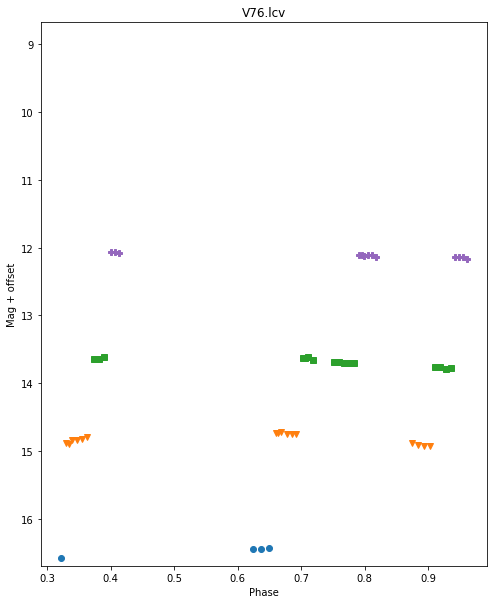

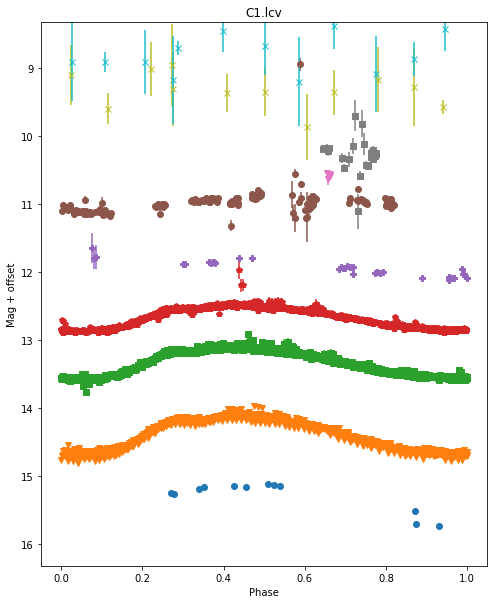

In [19]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder, old=1)
    except:
        print star, ' not found.'
        continue

## Fit light curves

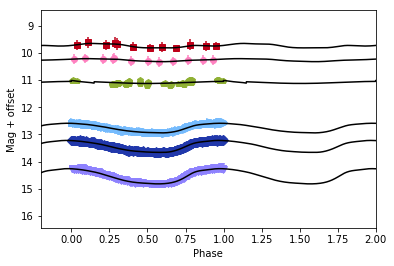

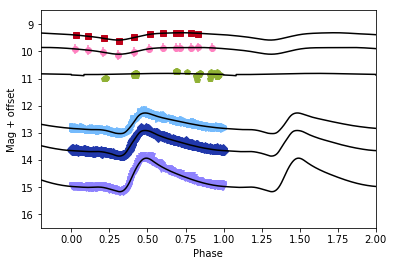

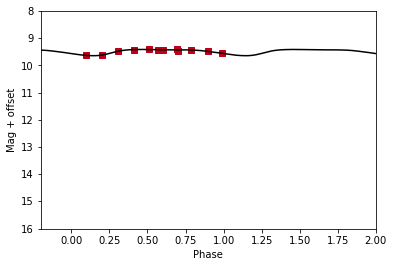

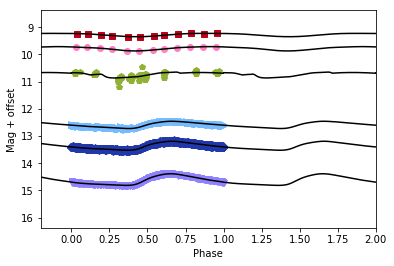

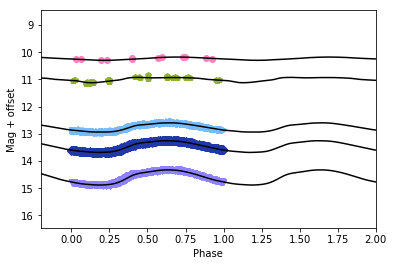

...

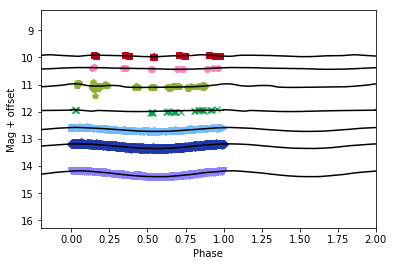

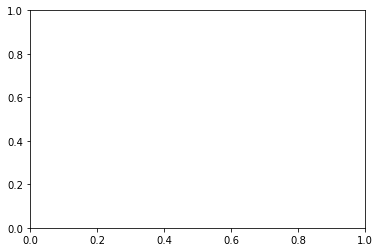

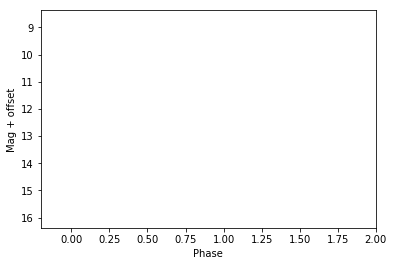

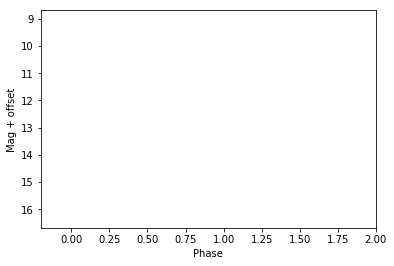

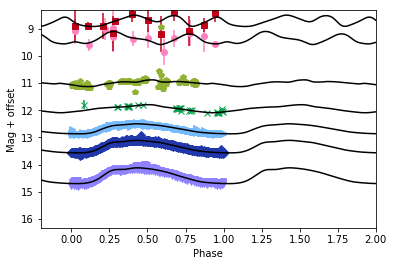

In [3]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
f = open(folder+'avg_mags.txt', 'w')

for ind, star in enumerate(data['id']):
    try:
        if data['new_period'][ind] == np.nan: 
            continue
        filters, avgmag, err, amp, sigma = lightcurves.gloess(folder+'lcvs/'+star+'.phased', ask=0, master_plot=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(filters)),filters, np.repeat(data['new_period'][ind], len(filters)), avgmag, err, amp, sigma), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float), ('c7', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %6.4f %4.2f %4.2f')
    except:
        continue
        print 'Star '+star+' failed.'
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in divide
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in divide


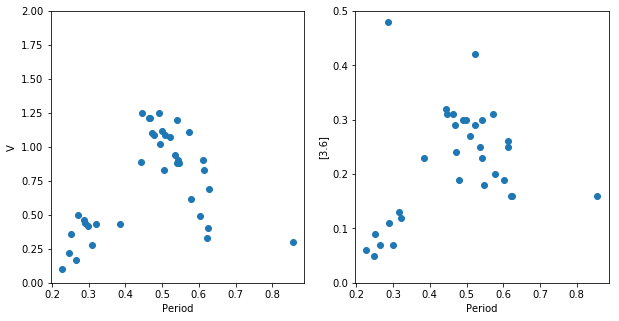

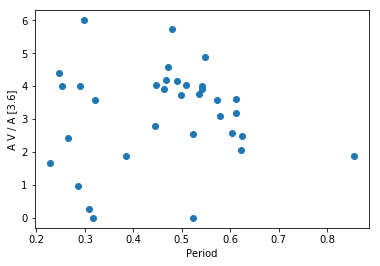

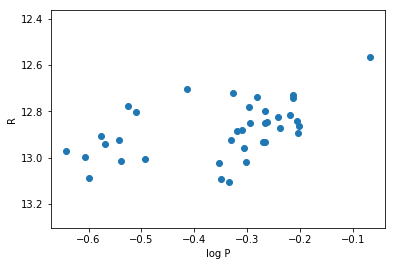

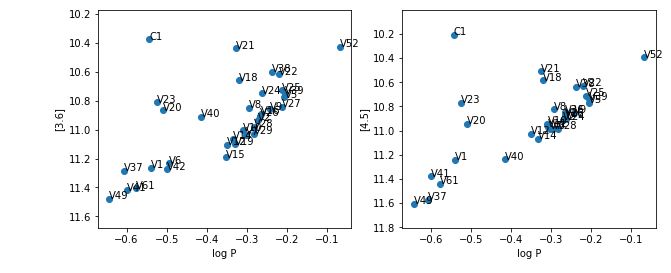

In [4]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,5))

perV = data['period'][data['filt'] == 'V']
perI1 = data['period'][data['filt'] == 'I1']
perI2 = data['period'][data['filt'] == 'I2']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']
I2amp = data['amp'][data['filt'] == 'I2']
I1 = data['avg'][data['filt'] == 'I1']
I2 = data['avg'][data['filt'] == 'I2']
V = data['avg'][data['filt'] == 'V']

# Bailey diagram
fig = mp.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.plot(perV[V > 0], Vamp[V > 0], 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')
ax2 = fig.add_subplot(122)
ax2.plot(perI1[I1 > 0], I1amp[I1 > 0], 'o')
ax2.set_ylim((0,0.5))
ax2.set_xlabel('Period')
ax2.set_ylabel('[3.6]')


# amplitude ratio 

R_amp = Vamp/I1amp
fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(perV, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# R band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Rper = data['period'][data['filt'] == 'R']
R = data['avg'][data['filt'] == 'R']
ax5.plot(np.log10(Rper[R > 0]), R[R > 0], 'o')
ax5.set_ylim((np.max(R[R > 0])+0.2,np.min(R[R>0])-0.2))
ax5.set_xlabel('log P')
ax5.set_ylabel('R')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
ax1.plot(np.log10(perI1[I1 > 0]), I1[I1 > 0], 'o')
ax1.set_ylim((np.max(I1[I1 > 0])+0.2,np.min(I1[I1 > 0])-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(perI2[I2 > 0]), I2[I2 > 0], 'o')
ax2.set_ylim((np.max(I2[I2 > 0])+0.2,np.min(I2[I2 > 0])-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

I1_labels = data['star'][data['filt'] == 'I1']
for label, x, y in zip(I1_labels, np.log10(perI1), I1):
    ax1.annotate(label, xy=(x, y))

I2_labels = data['star'][data['filt'] == 'I2']
for label, x, y in zip(I2_labels, np.log10(perI2), I2):
    ax2.annotate(label, xy=(x, y))

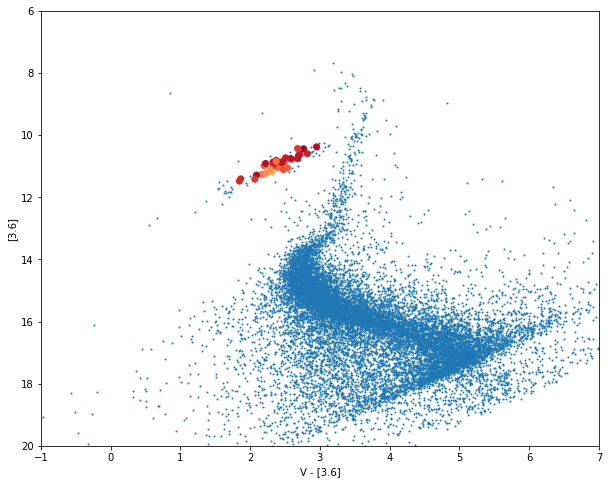

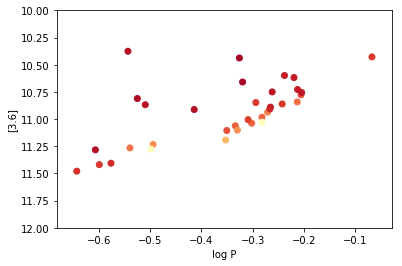

In [8]:
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(10,8))
ax2 = fig2.add_subplot(111)
ax2.scatter(colorVIR, magIR, s=1, edgecolor=None)
ax2.set_ylim((20,6))
ax2.set_xlim((-1,7))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('err', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,4,5))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']
var_err = data['err'][data['filt'] == 'I1']

rdists = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]

cm = mp.cm.get_cmap('RdYlBu')    
ax2.scatter(var_color, var_mag, c=rdists, cmap=cm) 
#ax2.plot(var_color, var_mag, 'o', color='r')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.scatter(np.log10(var_period), var_mag, c=rdists, cmap=cm) 
#mp.colorbar()
#ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.set_ylim((12,10))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

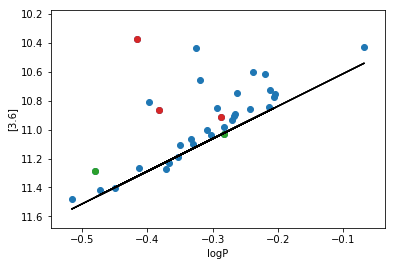

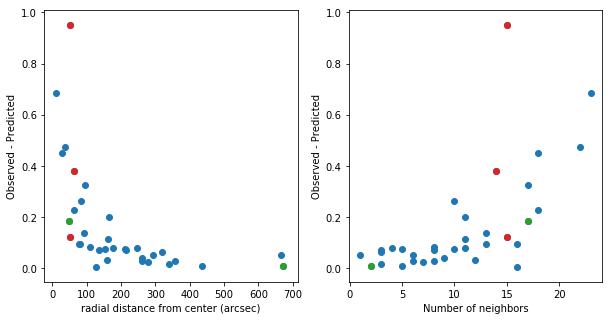

In [11]:
import numpy.ma as ma
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']
var_err = data['err'][data['filt'] == 'I1']
var_mag = var_mag[~np.isnan(var_period)]
var_id = var_id[~np.isnan(var_period)]
var_err = var_err[~np.isnan(var_period)]
var_period = var_period[~np.isnan(var_period)]

cat_ra, cat_dec = coordinates.hms2deg(catalog_data['ra_h'], catalog_data['ra_m'], 
                                      catalog_data['ra_s'], catalog_data['dec_d'], 
                                      catalog_data['dec_m'], catalog_data['dec_s'])

rdists = np.zeros(len(var_id))
num_neighbors = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]
    # find neighbors
    # need to find coordinates of the RRL 
    RRL_ra = cat_ra[catalog_data['id'] == dao_id[0]]
    RRL_dec = cat_dec[catalog_data['id'] == dao_id[0]]
    d = coordinates.radial_dist(RRL_ra, RRL_dec, cat_ra, cat_dec)
    num_neighbors[ind] = len(d[d < 8.0])
    
var_id = var_id[var_mag > 0]
var_logP = np.log10(var_period[var_mag > 0])
rdists = rdists[var_mag > 0]
var_err = var_err[var_mag > 0]
num_neighbors = num_neighbors[var_mag > 0]
var_mag = var_mag[var_mag > 0]
var_logP[var_logP < -0.4] += 0.127

# Double mode RRL
# none
double = [] 
mask_double = np.in1d(var_id, double)

# Stars with bad periods
# V23, V49, 
bad_period = ['V29', 'V37']
mask_period = np.in1d(var_id, bad_period)

# Other stars with bad MIR lcvs
bad_lcv = ['V20', 'V40', 'C1']
mask_lcv = np.in1d(var_id, bad_lcv)


# Theoretical relation
feh = -1.16
mu = 11.39
plz = -2.251*var_logP + 0.180*feh - 0.793 + mu
fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.scatter(var_logP, var_mag)
ax1.scatter(var_logP[mask_double], var_mag[mask_double])
ax1.scatter(var_logP[mask_period], var_mag[mask_period])
ax1.scatter(var_logP[mask_lcv], var_mag[mask_lcv])
ax1.plot(var_logP, plz, 'k-')
ax1.set_ylim(np.max(var_mag)+0.2, np.min(var_mag)-0.2)
ax1.set_xlabel('logP')
ax1.set_ylabel('[3.6]')

residuals = np.abs(var_mag - plz)
fig2 = mp.figure(figsize=(10,5))
ax1 = fig2.add_subplot(121)
ax1.scatter(rdists, residuals)
ax1.scatter(rdists[mask_double], residuals[mask_double])
ax1.scatter(rdists[mask_period], residuals[mask_period])
ax1.scatter(rdists[mask_lcv], residuals[mask_lcv])
ax1.set_xlabel('radial distance from center (arcsec)')
ax1.set_ylabel('Observed - Predicted')
ax2 = fig2.add_subplot(122)
ax2.scatter(num_neighbors, residuals)
ax2.scatter(num_neighbors[mask_double], residuals[mask_double])
ax2.scatter(num_neighbors[mask_period], residuals[mask_period])
ax2.scatter(num_neighbors[mask_lcv], residuals[mask_lcv])
ax2.set_xlabel('Number of neighbors')
ax2.set_ylabel('Observed - Predicted')

[ -2.41598313  10.20736063]
0.162652606356
[ -2.65247801  10.18382464]
0.0769662038646


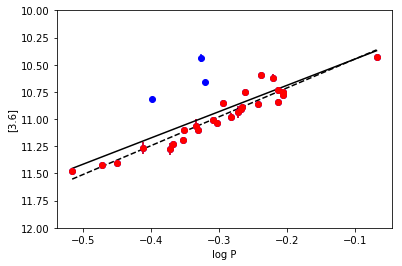

In [14]:
m_id = ma.array(var_id)
m_id[mask_double] = ma.masked
m_id[mask_period] = ma.masked
m_id[mask_lcv] = ma.masked
m_logP = ma.array(var_logP)
m_logP[mask_double] = ma.masked
m_logP[mask_period] = ma.masked
m_logP[mask_lcv] = ma.masked
m_mag = ma.array(var_mag)
m_mag[mask_double] = ma.masked
m_mag[mask_period] = ma.masked
m_mag[mask_lcv] = ma.masked
m_err = ma.array(var_err)
m_err[mask_double] = ma.masked
m_err[mask_period] = ma.masked
m_err[mask_lcv] = ma.masked

good_logP = m_logP[rdists > 50]
good_mag = m_mag[rdists > 50]
good_err = m_err[rdists > 50]
good_id = m_id[rdists > 50]


fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.errorbar(m_logP, m_mag, yerr=m_err, fmt='o', color='b')
ax1.errorbar(good_logP, good_mag, yerr=good_err, fmt='o', color='r')
ax1.set_ylim((12,10))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')

fit = ma.polyfit(m_logP, m_mag, 1)
print fit
residuals =m_mag - (fit[0]*m_logP + fit[1])
print np.std(residuals)

fit2 = ma.polyfit(good_logP, good_mag, 1)
print fit2
residuals2 = good_mag - (fit2[0]*good_logP + fit2[1])
print np.std(residuals2)

x_line = np.array([np.min(m_logP), np.max(m_logP)])
yline1 = fit[0]*x_line+fit[1]
yline2 = fit2[0]*x_line+fit2[1]

ax1.plot(x_line, yline1, 'k-')
ax1.plot(x_line, yline2, 'k--')

[33, 14, 27]
[ -1.99739646  10.308816  ]
[ -2.43987298  10.27934364]
0.0496451035554


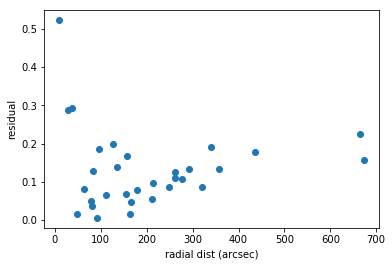

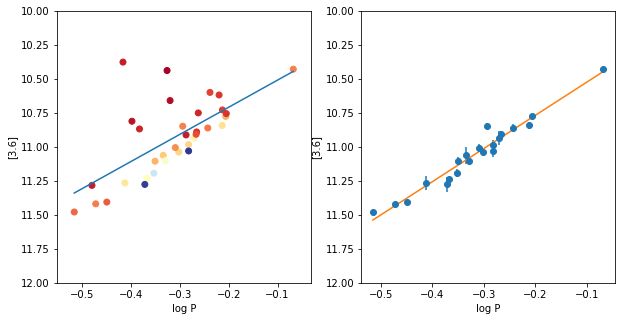

In [4]:
import numpy.ma as ma
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']
var_err = data['err'][data['filt'] == 'I1']
var_mag = var_mag[~np.isnan(var_period)]
var_id = var_id[~np.isnan(var_period)]
var_err = var_err[~np.isnan(var_period)]
var_period = var_period[~np.isnan(var_period)]
rdists = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]
    
var_id = var_id[var_mag > 0]
var_logP = np.log10(var_period[var_mag > 0])
rdists = rdists[var_mag > 0]
var_err = var_err[var_mag > 0]
var_mag = var_mag[var_mag > 0]
var_logP[var_logP < -0.4] += 0.127



# remove stars with bad light curves
bad_lcv = ['C1', 'V20', 'V40']

bad_index = [np.argwhere(var_id == x)[0][0] for x in bad_lcv]
print bad_index
masked_id = ma.array(var_id)
masked_id[bad_index] = ma.masked
masked_logP = ma.array(var_logP)
masked_logP[bad_index] = ma.masked
masked_mag = ma.array(var_mag)
masked_mag[bad_index] = ma.masked
masked_dists = ma.array(rdists)
masked_dists[bad_index] = ma.masked
masked_err = ma.array(var_err)
masked_err[bad_index] = ma.masked
# remove stars with questionable period?
# identify blended radius?
# remove stars near core of the cluster

fit = np.polyfit(masked_logP, masked_mag, 1)
print fit
residuals = np.abs(masked_mag - (fit[0]*masked_logP+fit[1]))
fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(masked_dists, residuals, 'o')
ax1.set_xlabel('radial dist (arcsec)')
ax1.set_ylabel('residual')

fig3 = mp.figure(figsize=(10,5))
ax3 = fig3.add_subplot(121)
ax3.scatter(var_logP, var_mag, c=rdists, cmap=cm) 
#mp.colorbar()
#ax3.plot(np.log10(var_period), var_mag, 'o')
x_line = np.array([np.min(var_logP), np.max(var_logP)])
y_line = fit[0]*x_line + fit[1]
ax3.plot(x_line, y_line)
ax3.set_ylim((12,10))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')
thresh = 100.
good_logP = masked_logP[masked_dists > thresh]
good_mag = masked_mag[masked_dists > thresh]
good_err = masked_err[masked_dists > thresh]
ax4 = fig3.add_subplot(122)
#ax4.scatter(masked_logP[masked_dists > thresh], masked_mag[masked_dists > thresh], c=masked_dists[masked_dists > thresh], cmap=cm) 
ax4.errorbar(good_logP, good_mag, yerr = good_err, fmt='o')
ax4.set_ylim((12,10))
ax4.set_xlabel('log P')
ax4.set_ylabel('[3.6]')

fit2 = np.polyfit(good_logP, good_mag, 1)
yline2 = fit2[0]*x_line+fit2[1]
ax4.plot(x_line, yline2)
residuals2 = good_mag - (fit2[0]*good_logP + fit2[1])
print fit2
print np.std(residuals2)

[30, 13, 25]
[ -2.09488729  10.26494686]
[ -2.60987301  10.16716935]
0.0628350293019


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


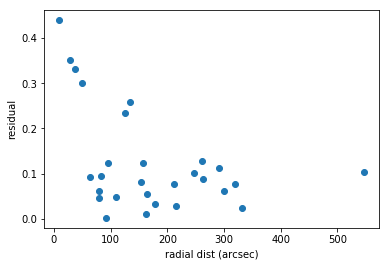

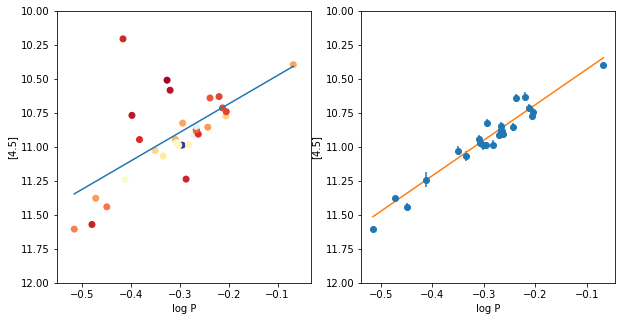

In [5]:
var_mag = data['avg'][data['filt'] == 'I2']
var_id = data['star'][data['filt'] == 'I2']
var_period = data['period'][data['filt'] == 'I2']
var_err = data['err'][data['filt'] == 'I2']
var_mag = var_mag[~np.isnan(var_period)]
var_id = var_id[~np.isnan(var_period)]
var_err = var_err[~np.isnan(var_period)]
var_period = var_period[~np.isnan(var_period)]
rdists = np.zeros(len(var_id))
for ind, star in enumerate(var_id):
    # find radial dist for this star
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdists[ind] = dist[catalog_data['id'] == dao_id[0]]
    
var_id = var_id[var_mag > 0]
var_logP = np.log10(var_period[var_mag > 0])
rdists = rdists[var_mag > 0]
var_err = var_err[var_mag > 0]
var_mag = var_mag[var_mag > 0]
var_logP[var_logP < -0.4] += 0.127



# remove stars with bad light curves
bad_lcv = ['C1', 'V20', 'V40']

bad_index = [np.argwhere(var_id == x)[0][0] for x in bad_lcv]
print bad_index
masked_id = ma.array(var_id)
masked_id[bad_index] = ma.masked
masked_logP = ma.array(var_logP)
masked_logP[bad_index] = ma.masked
masked_mag = ma.array(var_mag)
masked_mag[bad_index] = ma.masked
masked_dists = ma.array(rdists)
masked_dists[bad_index] = ma.masked
masked_err = ma.array(var_err)
masked_err[bad_index] = ma.masked
# remove stars with questionable period?
# identify blended radius?
# remove stars near core of the cluster

fit = np.polyfit(masked_logP, masked_mag, 1)
print fit
residuals = np.abs(masked_mag - (fit[0]*masked_logP+fit[1]))
fig1 = mp.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(masked_dists, residuals, 'o')
ax1.set_xlabel('radial dist (arcsec)')
ax1.set_ylabel('residual')

fig3 = mp.figure(figsize=(10,5))
ax3 = fig3.add_subplot(121)
ax3.scatter(var_logP, var_mag, c=rdists, cmap=cm) 
#mp.colorbar()
#ax3.plot(np.log10(var_period), var_mag, 'o')
x_line = np.array([np.min(var_logP), np.max(var_logP)])
y_line = fit[0]*x_line + fit[1]
ax3.plot(x_line, y_line)
ax3.set_ylim((12,10))
ax3.set_xlabel('log P')
ax3.set_ylabel('[4.5]')
thresh = 60.
good_logP = masked_logP[masked_dists > thresh]
good_mag = masked_mag[masked_dists > thresh]
good_err = masked_err[masked_dists > thresh]
ax4 = fig3.add_subplot(122)
#ax4.scatter(masked_logP[masked_dists > thresh], masked_mag[masked_dists > thresh], c=masked_dists[masked_dists > thresh], cmap=cm) 
ax4.errorbar(good_logP, good_mag, yerr=good_err, fmt='o')
ax4.set_ylim((12,10))
ax4.set_xlabel('log P')
ax4.set_ylabel('[4.5]')

fit2 = np.polyfit(good_logP, good_mag, 1)
yline2 = fit2[0]*x_line+fit2[1]
ax4.plot(x_line, yline2)
residuals2 = good_mag - (fit2[0]*good_logP + fit2[1])
print fit2
print np.std(residuals2)

# Single epoch mosaics

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder, mosaics=1)
calibration.find_lst_stars(target, 'I2', data_dir=folder, mosaics=1)

[80399] [80442 80540]
[80423] [80673]
[78171] [77959]
[69315] []
[66357] [66028 66004]
[73403] [72946 73655]
[75488] []
[73455] [73147 73250]
[71405] []
[69259] [69552 69281 69667]
[68541] [68342]
[65698] [65277]
[65090] [64787]
[65466] []
[65465] []
[67216] []
[64315] []
[47444] [48043 46942]
[62711] [62821 62266]
[62975] [62916]
[43315] []
[53950] [53422 54493]
[53879] [54338 53655]
[47521] [47459]
[49688] [50227]
[35144] [34628 34887]
[37592] [37304]
[79560] [79492]
[72521] [72764 72911 72344]
[68221] []
[76634] [76919 76756]
[70084] []
[68500] [68746]
[68277] [67824]
[66134] []
[66682] []
[66734] []
[63491] [63768 63138]
[66692] [66993 66293]
[66357] [66028 66004]
[62380] [61837]
[66482] [66526]
[72210] [72520 72129]
[59599] [59192]
[62061] [61637]
[59961] [59439 60221 59860]
[55042] [55540]
[63713] [64032 63658 63327 63488 63214 63364]
[58186] []
[53510] []
[53064] [52944]
[48219] [48587]
[53484] [54053 53772 52933]
[47444] [48043 46942]
[45569] [46134 46012 45795]
[42649] [42128]

In [4]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/', mosaics=1)
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/', mosaics=1)


  READ NOISE (ADU; 1 frame) =     3.95        GAIN (e-/ADU; 1 frame) =     3.70
 LOW GOOD DATUM (in sigmas) =    10.00      HIGH GOOD DATUM (in ADU) = 30000.00
             FWHM OF OBJECT =     4.00         THRESHOLD (in sigmas) =     6.00
  LS (LOW SHARPNESS CUTOFF) =     0.30    HS (HIGH SHARPNESS CUTOFF) =     1.40
  LR (LOW ROUNDNESS CUTOFF) =    -1.00    HR (HIGH ROUNDNESS CUTOFF) =     1.00
             WATCH PROGRESS =    -1.00                FITTING RADIUS =     4.00
                 PSF RADIUS =    19.00                  VARIABLE PSF =     0.00
              SKY ESTIMATOR =     0.00            ANALYTIC MODEL PSF =     2.00
  EXTRA PSF CLEANING PASSES =     5.00       USE SATURATED PSF STARS =     0.00
       PERCENT ERROR (in %) =     0.75          PROFILE ERROR (in %) =     5.00

 Command: at NGC6121m:I1_46731520.fits
at NGC6121m:I1_46731520.fits

     NGC6121m:I1_46731520...                 


                                      Picture size:   2578  1426


 Command: phot

 PHO> 


 Input position file (default 
                         NGC6121m:I1_46773760.coo): 

     Output file (default NGC6121m:I1_46773760.ap): 


 Command: at NGC6121m:I1_46774272.fits
at NGC6121m:I1_46774272.fits

     NGC6121m:I1_46774272...                 


                                      Picture size:   2578  1426


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     6.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     6.00     OS       OUTER SKY RADIUS =    14.00

 PHO> 


 Input position file 

 PHO> 


 Input position file (default 
                         NGC6121m:I2_46772736.coo): 

     Output file (default NGC6121m:I2_46772736.ap): 


 Command: at NGC6121m:I2_46772992.fits
at NGC6121m:I2_46772992.fits

     NGC6121m:I2_46772992...                 


                                      Picture size:   2578  1426


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     6.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     6.00     OS       OUTER SKY RADIUS =    14.00

 PHO> 


 Input position file 

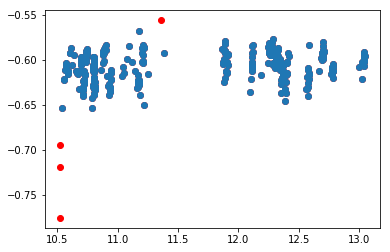

-0.610713793103 0.0188087694906
-0.60827 0.016135584898
There are 26 psf stars.


calibration.py:343: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 2086 but corresponding boolean dimension is 304
  x = obs_num[names == star]


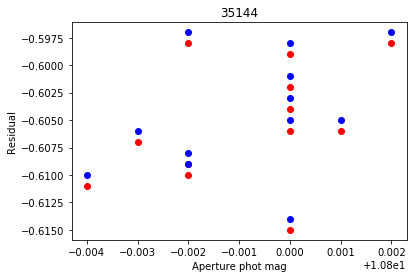

0.004 0.019
0.00126885775405 0.00516139516023


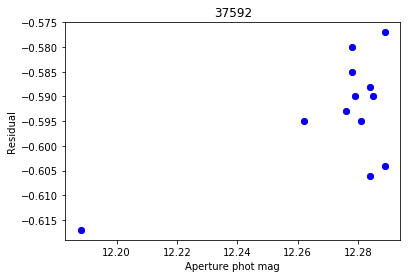

0.013 0.035
0.00438292140016 0.0105304320899


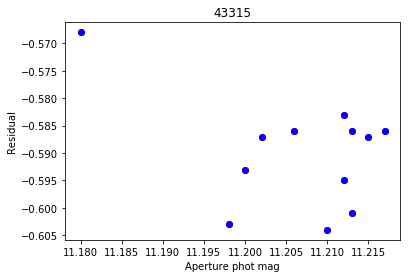

0.007 0.019
0.00209956263667 0.00670668262532


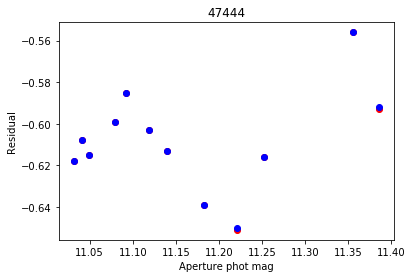

0.151 0.173
0.0494126438779 0.0565230870972


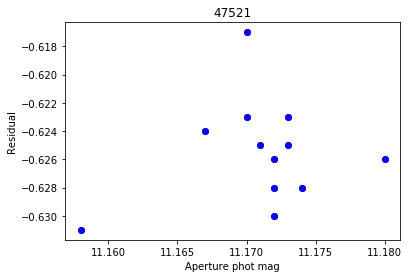

0.004 0.015
0.00128620410031 0.0044583116995


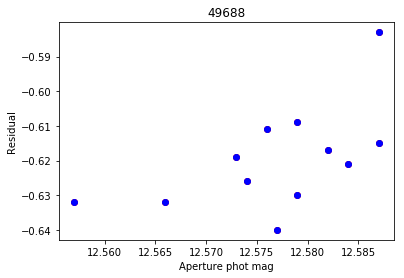

0.014 0.047
0.00479165942029 0.0125733845881


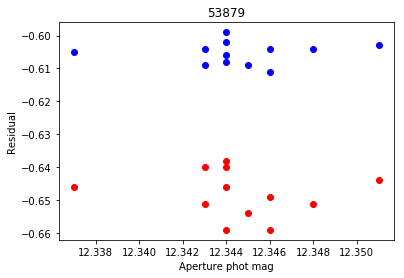

0.003 0.014
0.00105409255339 0.00403992421393


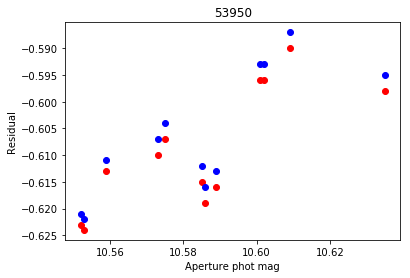

0.057 0.032
0.0189125870894 0.0116100554878


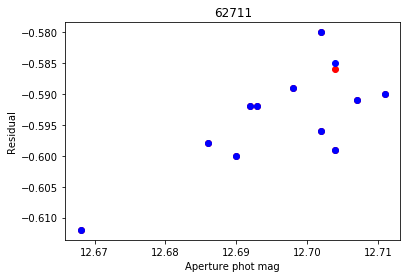

0.021 0.021
0.00652763356815 0.0072394751191


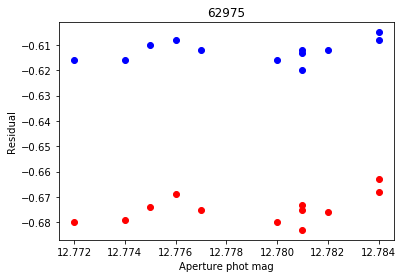

0.008 0.017
0.00258198889747 0.00454877544232


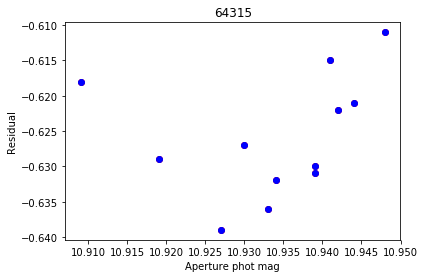

0.021 0.014
0.00622976725087 0.00482597140481


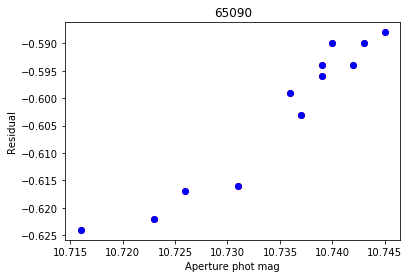

0.009 0.01
0.00284769643747 0.00273575857853


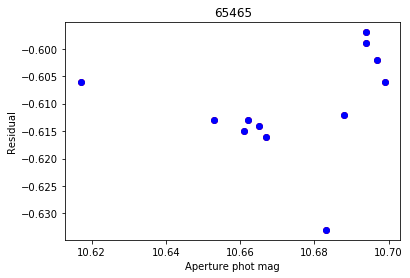

0.046 0.05
0.016227718354 0.0143163779527


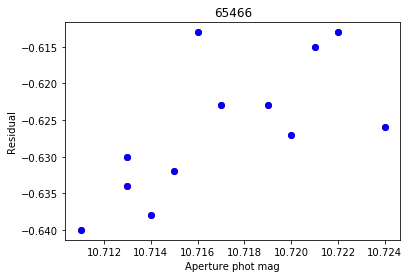

0.013 0.023
0.00392552190444 0.00683282518436


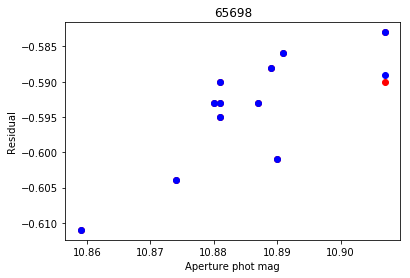

0.048 0.026
0.0126323548434 0.00804630695136


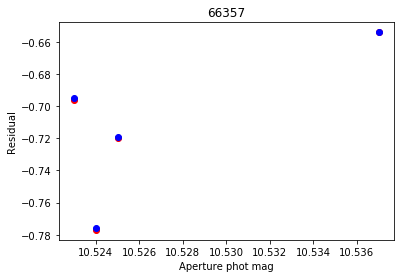

0.002 0.082
0.000816496580927 0.0342150064543


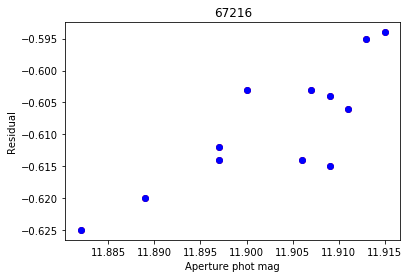

0.018 0.021
0.00608604962188 0.00593632883186


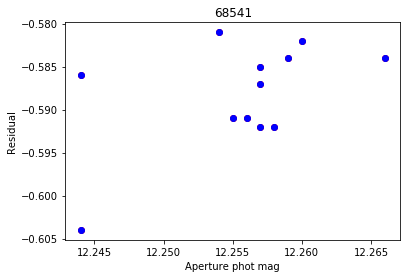

0.006 0.015
0.00176383420738 0.00426296135406


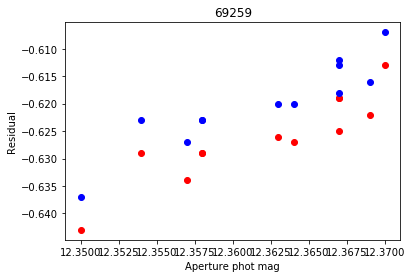

0.016 0.008
0.00523023631405 0.00284009079124


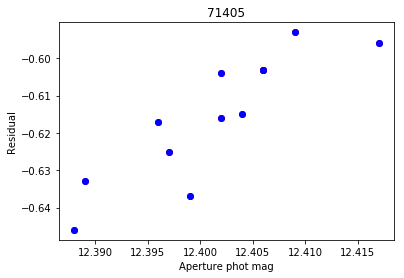

0.029 0.034
0.00784352174303 0.0100453831297


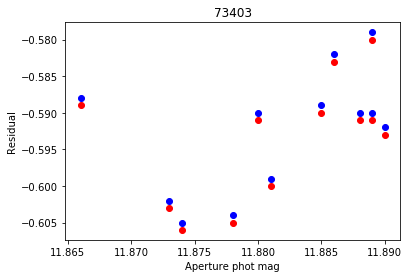

0.012 0.014
0.00417517649512 0.00545690184791


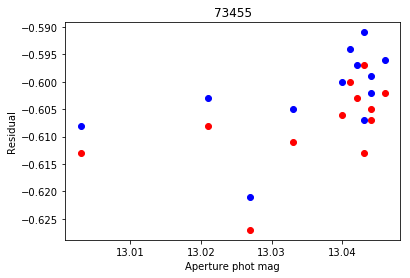

0.006 0.016
0.00176334199746 0.00501092556321


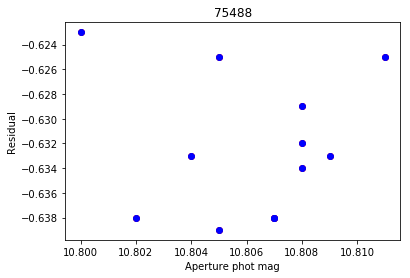

0.007 0.015
0.00198997487421 0.00455631429996


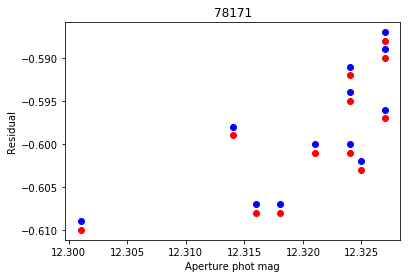

0.006 0.013
0.00196452920569 0.00440879802214


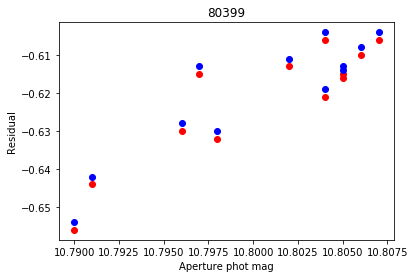

0.003 0.015
0.00106718737291 0.0050579969685


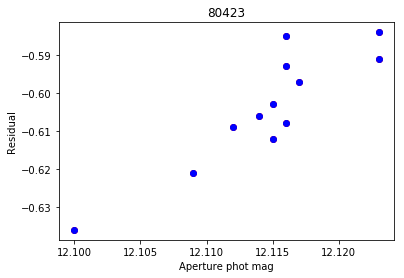

0.014 0.029
0.00393122696553 0.00842958191369


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


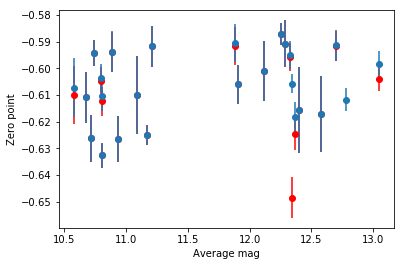

-0.608822228235 0.0155320943541
-0.606427813853 0.0127930224694


In [5]:
I1zp, I1zper = calibration.find_zp_bcds('I1', data_dir=folder, mosaics=1)

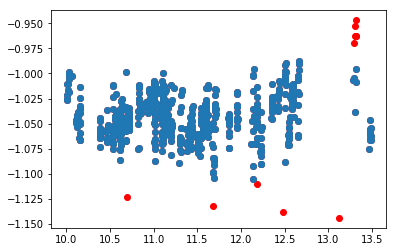

-1.04544385965 0.0223796862586
-1.04341496599 0.0208779555445
There are 50 psf stars.


calibration.py:343: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 4031 but corresponding boolean dimension is 599
  x = obs_num[names == star]


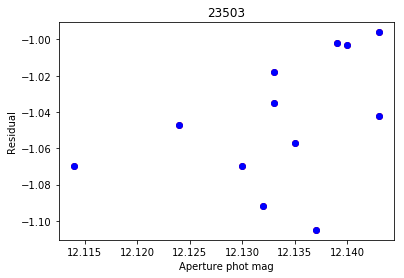

0.019 0.103
0.00551481850476 0.0329374563842


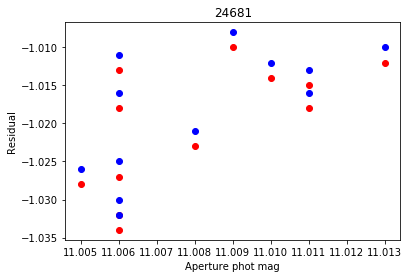

0.000999999999998 0.021
0.000372677996249 0.00742555646998


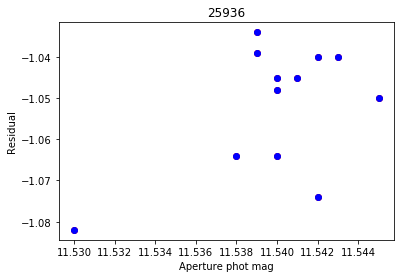

0.004 0.043
0.00128620410031 0.0131496608415


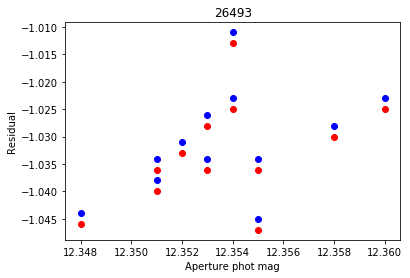

0.01 0.035
0.00250289089053 0.00860328593769


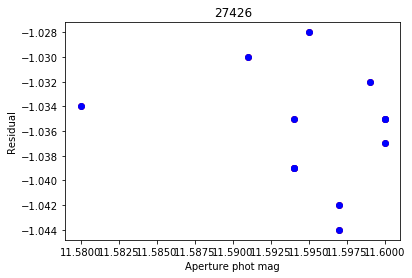

0.006 0.018
0.0024899799196 0.00490306026885


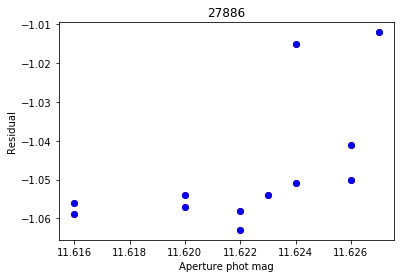

0.011 0.046
0.00348409082673 0.0143139403691


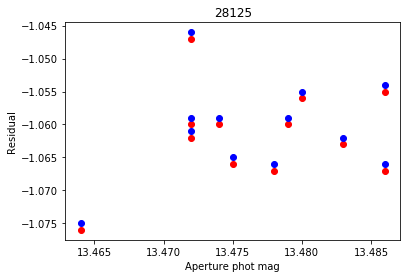

0.014 0.034
0.00514259477227 0.00847261022159


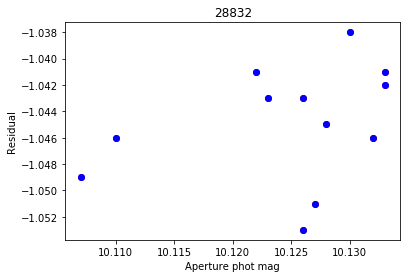

0.011 0.016
0.00374165738677 0.00525452186217


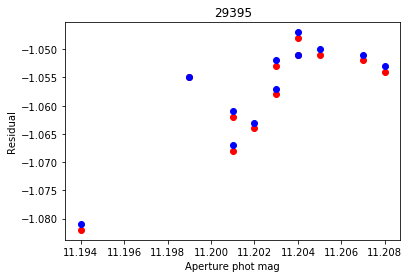

0.009 0.017
0.00253243423222 0.00492421911416


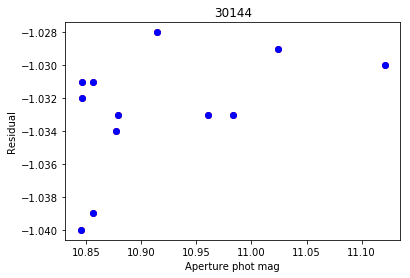

0.034 0.035
0.0134528655623 0.0134422422814


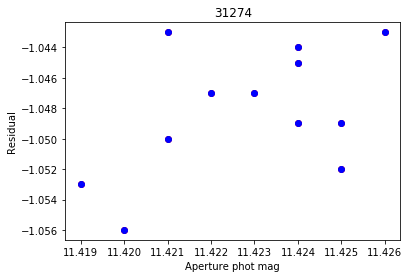

0.005 0.013
0.00162788205961 0.00341174442185


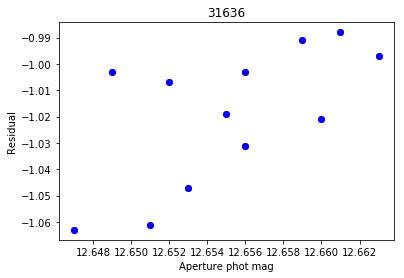

0.016 0.063
0.00475803414121 0.0222914719618


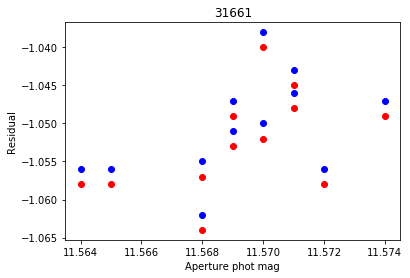

0.004 0.022
0.00131468439624 0.00646548290043


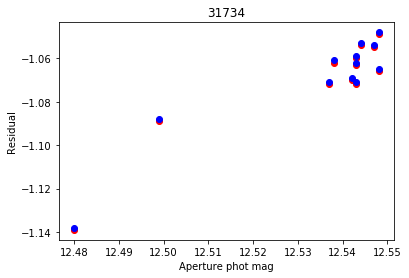

0.011 0.018
0.00357910603363 0.00628012738724


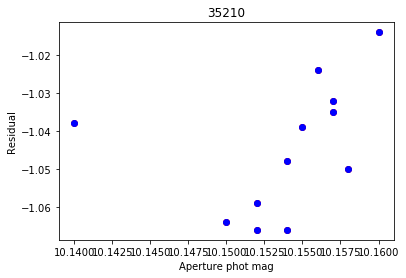

0.01 0.046
0.00282842712475 0.0147883134561


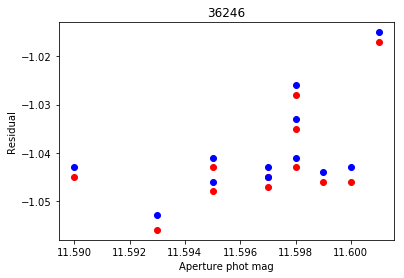

0.006 0.027
0.00183303027798 0.00866314030823


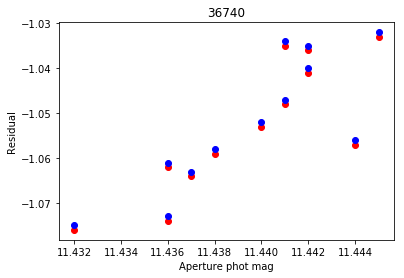

0.009 0.034
0.00294859540731 0.0107879639084


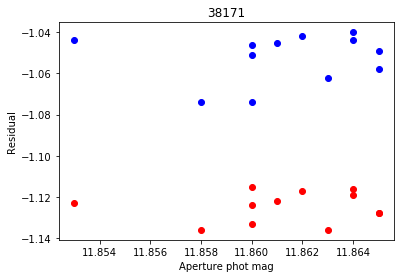

0.007 0.03
0.00225630429927 0.0108025096564


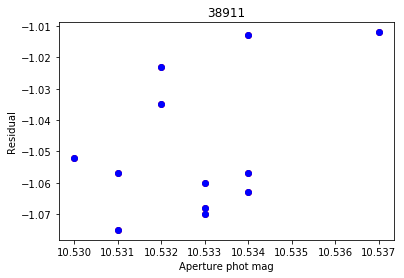

0.003 0.059
0.0011 0.019853463174


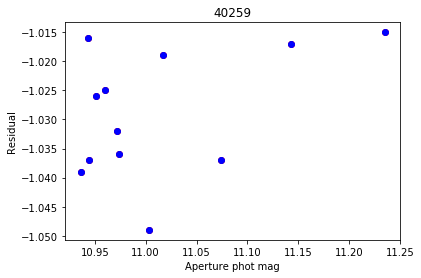

0.038 0.051
0.0136979068861 0.0162116108555


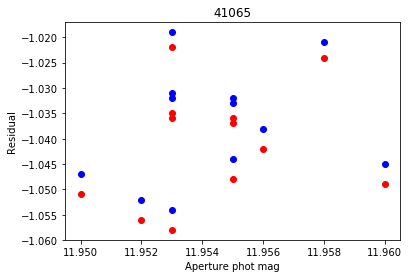

0.006 0.035
0.00168819430161 0.0100004999875


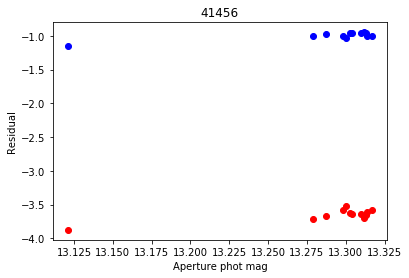

0.019 0.081
0.00638478128825 0.0284401038355


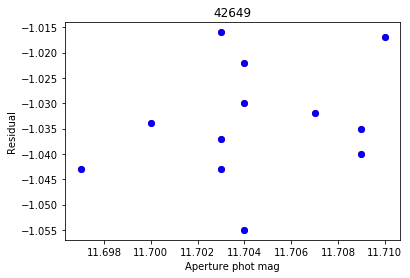

0.013 0.04
0.00366192875712 0.0105234526442


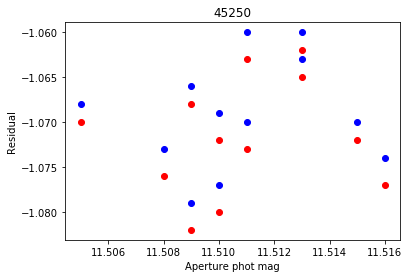

0.011 0.019
0.00293919868142 0.00619755776272


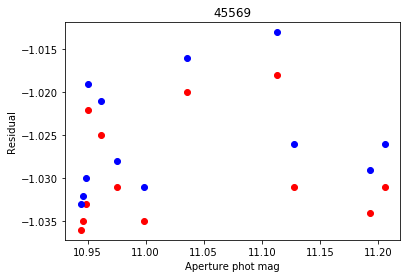

0.018 0.014
0.00627375485654 0.0045782092569


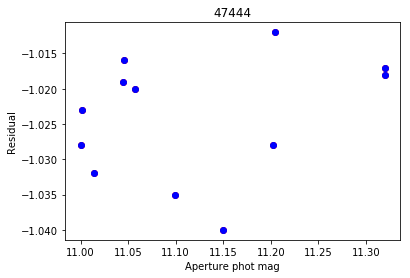

0.099 0.109
0.032753874985 0.0342124216611


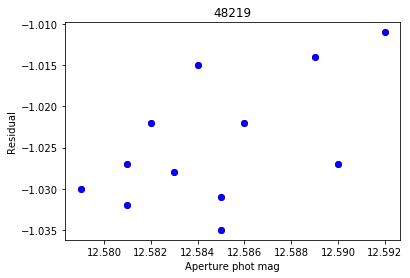

0.013 0.021
0.00378868930722 0.0061390145789


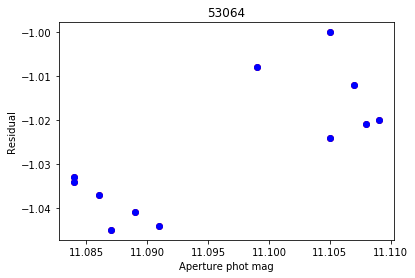

0.025 0.03
0.00977951373479 0.00930165755838


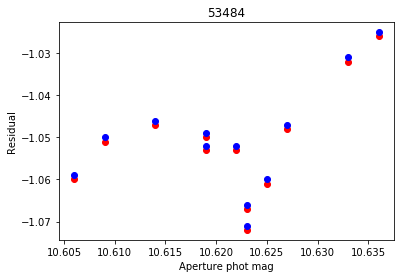

0.03 0.035
0.00843932593412 0.0112323936303


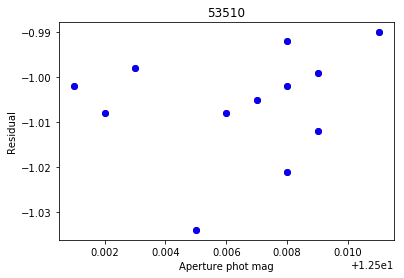

0.006 0.039
0.00166295883857 0.0120779362148


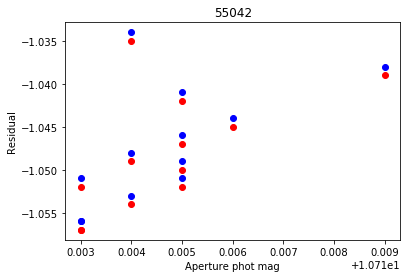

0.002 0.021
0.000830662386291 0.00613514466007


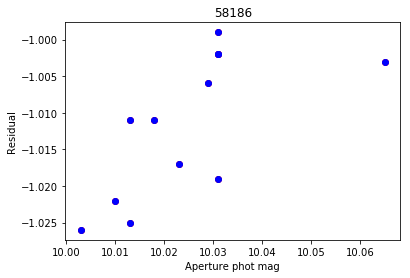

0.021 0.026
0.00828251169634 0.00674091981854


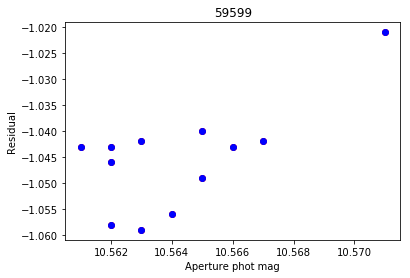

0.005 0.018
0.00155241746963 0.00679411510058


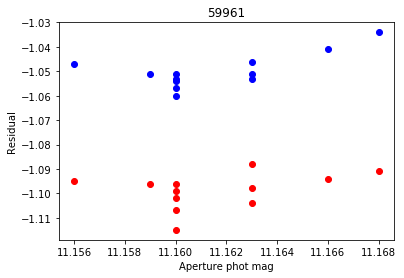

0.007 0.017
0.0020591260282 0.00451774279923


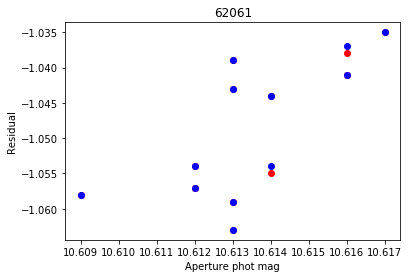

0.008 0.024
0.00206155281281 0.00806053485956


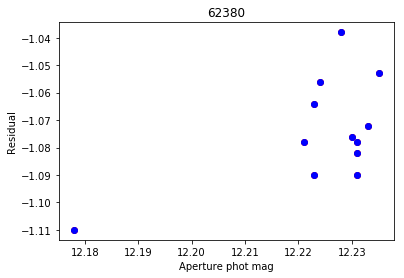

0.012 0.055
0.00403608721412 0.0166601320523


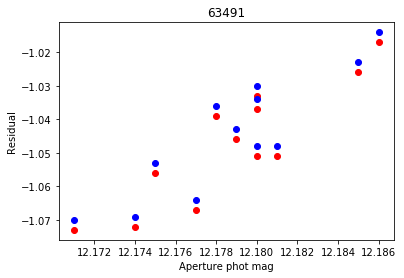

0.012 0.043
0.00349970482817 0.0130479091767


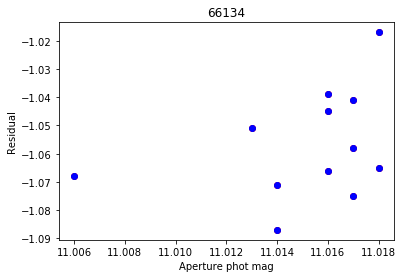

0.005 0.066
0.00159544807043 0.0182878725114


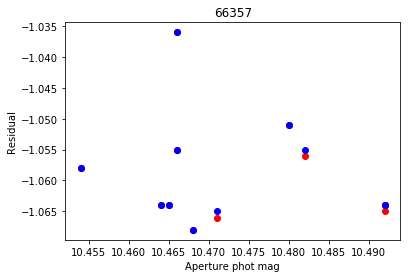

0.028 0.035
0.00800154306106 0.0113311544747


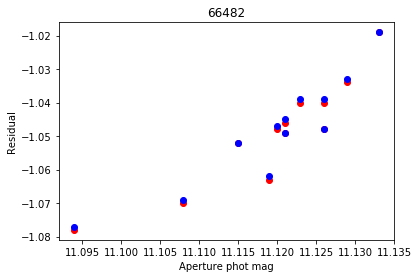

0.014 0.019
0.00402154690463 0.00573057642588


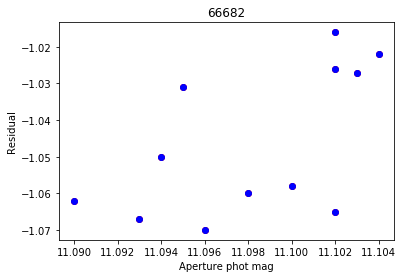

0.011 0.049
0.00376587548677 0.0176742797672


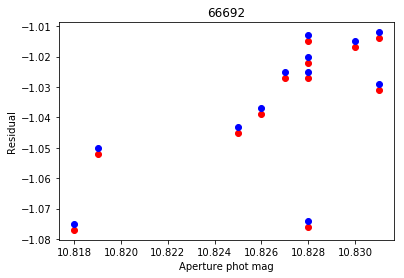

0.006 0.061
0.00188679622641 0.017048460341


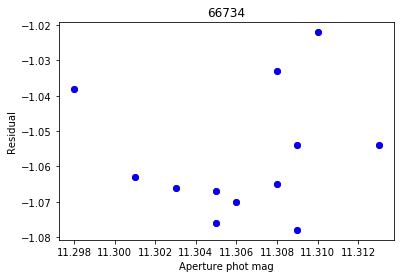

0.01 0.055
0.00276405499222 0.0162815846895


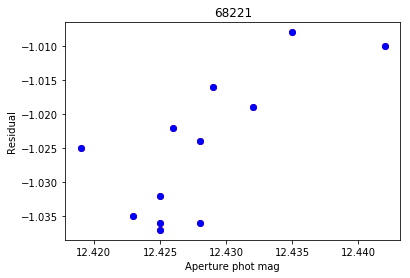

0.013 0.02
0.00337638860323 0.00683812839891


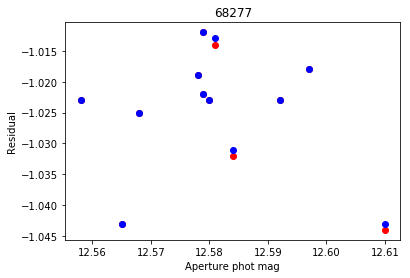

0.039 0.034
0.010771096923 0.0107434392819


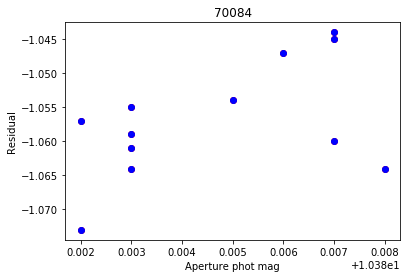

0.006 0.024
0.00213437474581 0.00739885501652


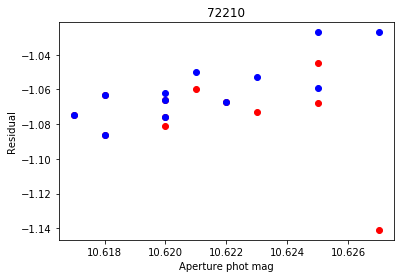

0.008 0.052
0.00258731808559 0.0131287332353


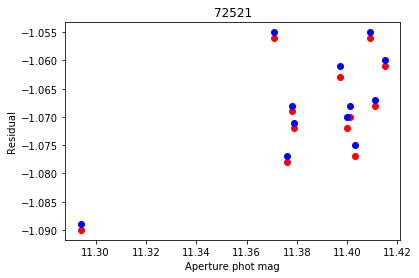

0.044 0.052
0.0149566867768 0.0152867900624


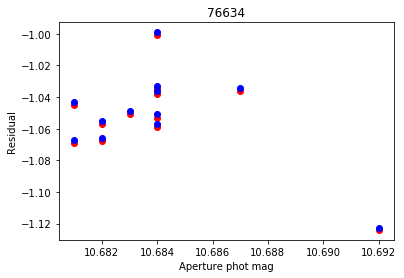

0.006 0.065
0.00165644246894 0.0175541664664


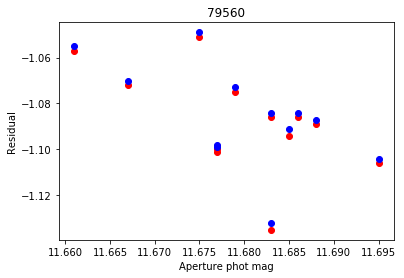

0.013 0.091
0.00432335032408 0.0225979350089


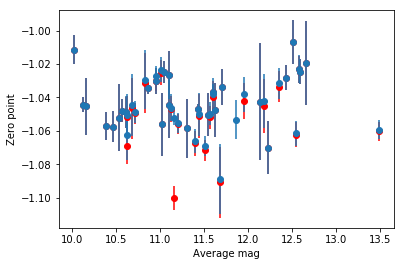

-1.04563802459 0.0180882338221
-1.04395455429 0.0158584408752


In [6]:
I2zp, I2zper = calibration.find_zp_bcds('I2', data_dir=folder, mosaics=1)

In [7]:
calibration.apply_calibration_bcds(target, 'I1', -0.61, data_dir=folder, mosaics=1)
calibration.apply_calibration_bcds(target, 'I2', -1.04, data_dir=folder, mosaics=1)

### Make MIR lcvs from multiepoch mosaics


In [9]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder, mosaics=1)

In [10]:
dtype1 = np.dtype([('id', 'S10'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'mosaic_lcvs/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=0)
    except:
        print lcv +' not found.'

V30 not found.
V31 not found.
V32 not found.
V33 not found.
V34 not found.
V35 not found.
V43 not found.
V64 not found.
V75 not found.
V76 not found.


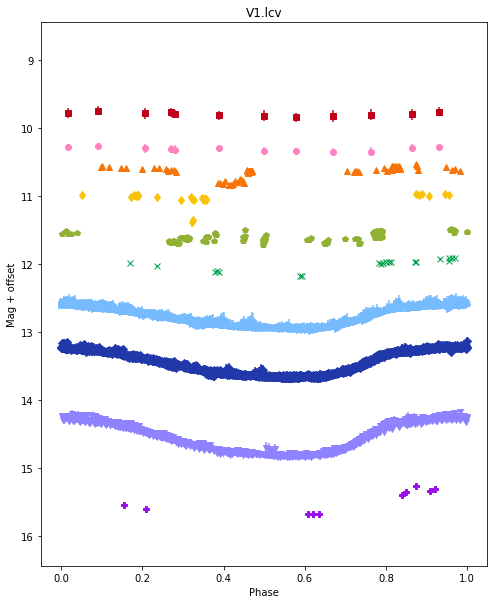

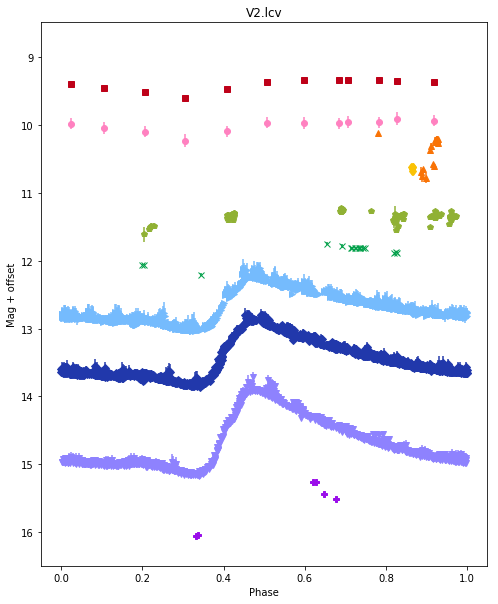

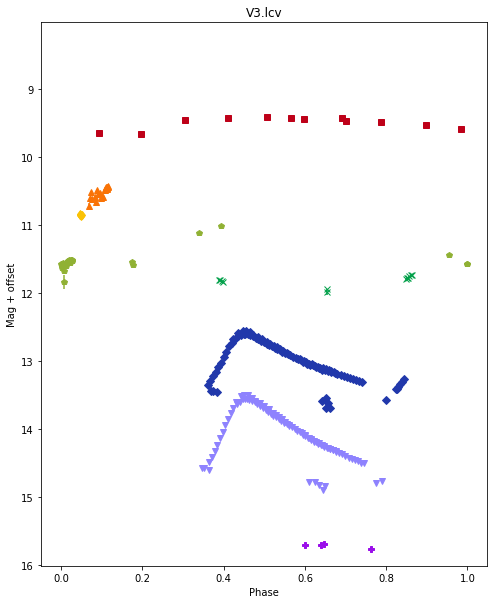

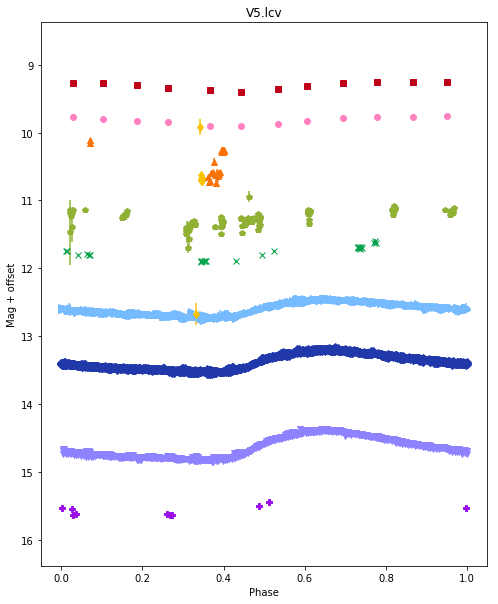

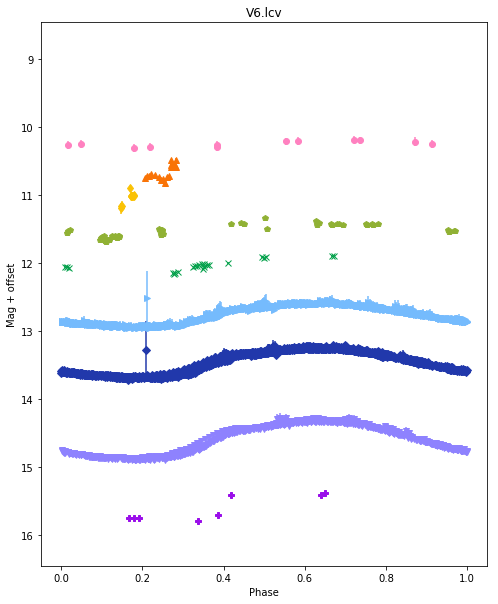

...

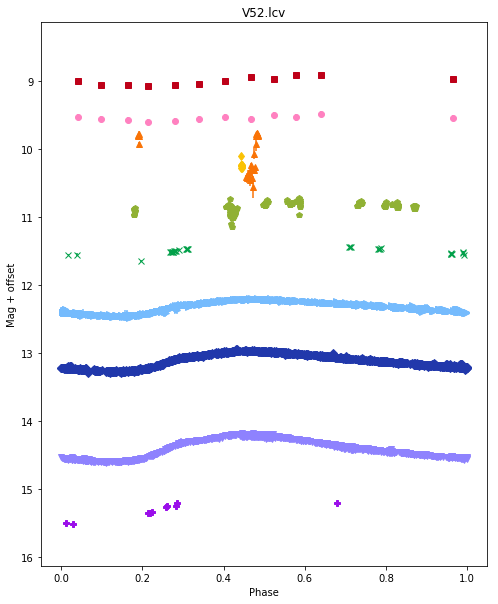

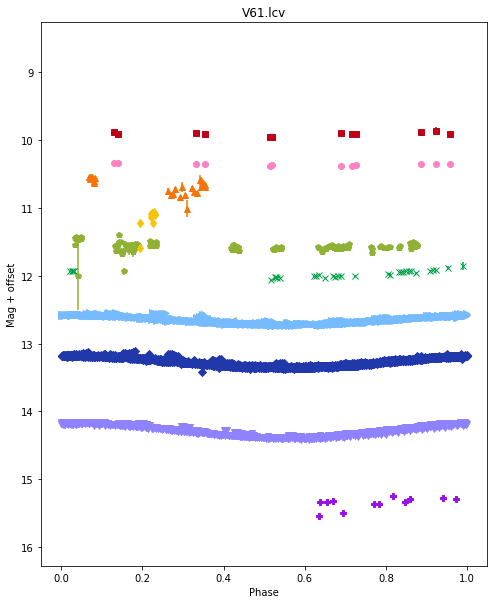

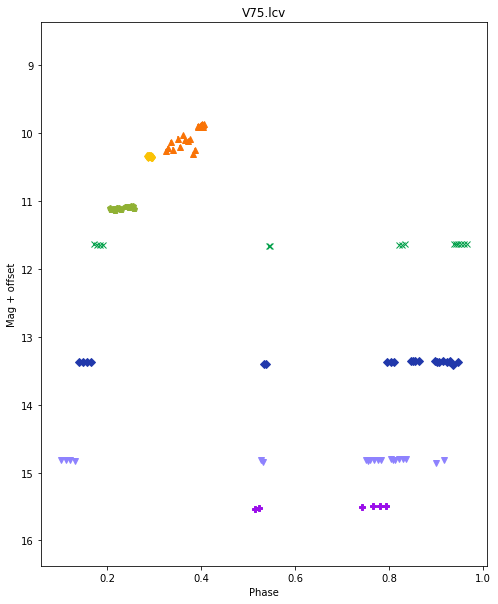

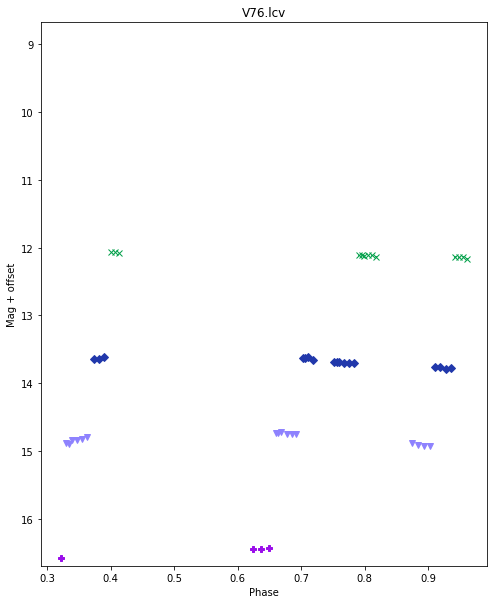

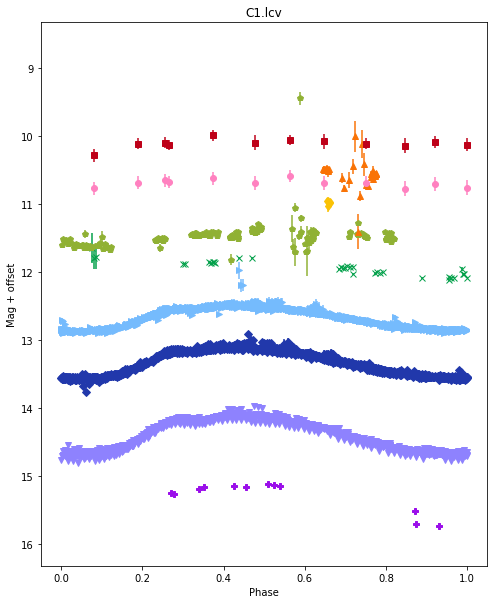

In [4]:
dtype1 = np.dtype([('id', 'S10'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):

    if np.isnan(data['new_period'][ind]):
        continue
            #lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
    try:
        lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder, old=1, mosaics=1)
    except:
        continue

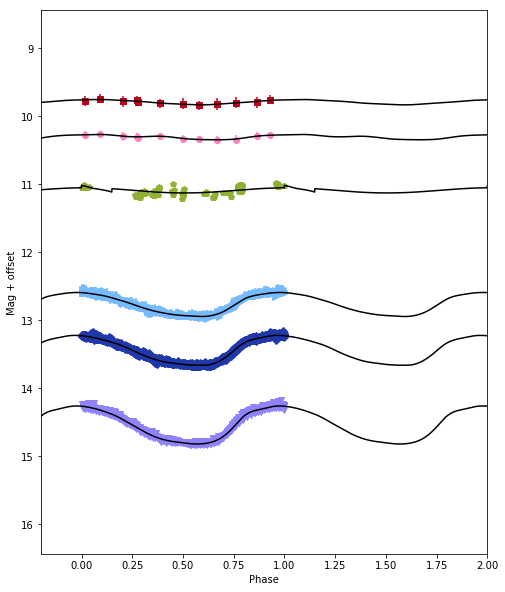

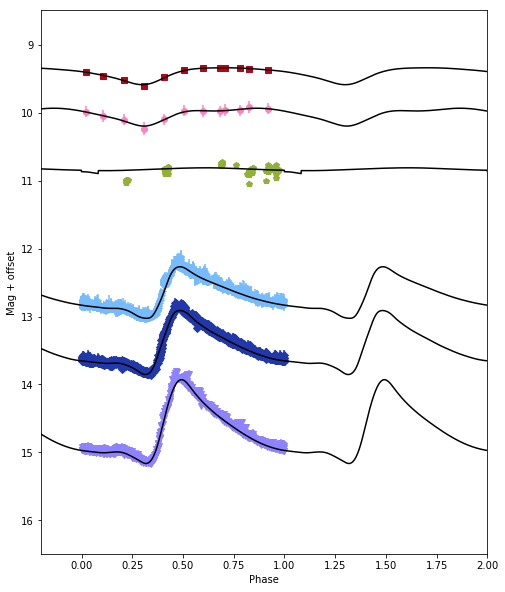

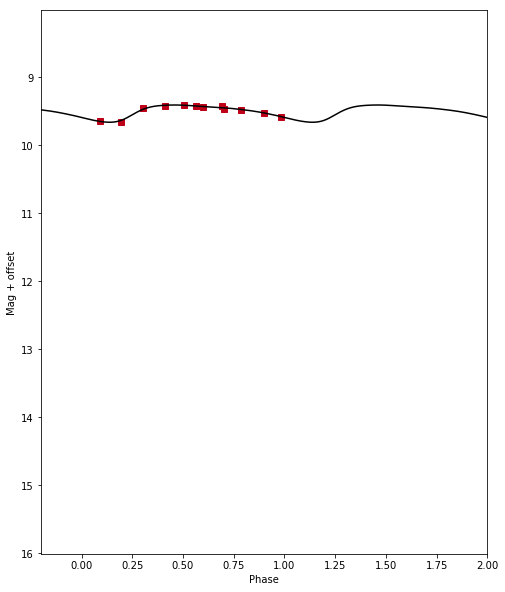

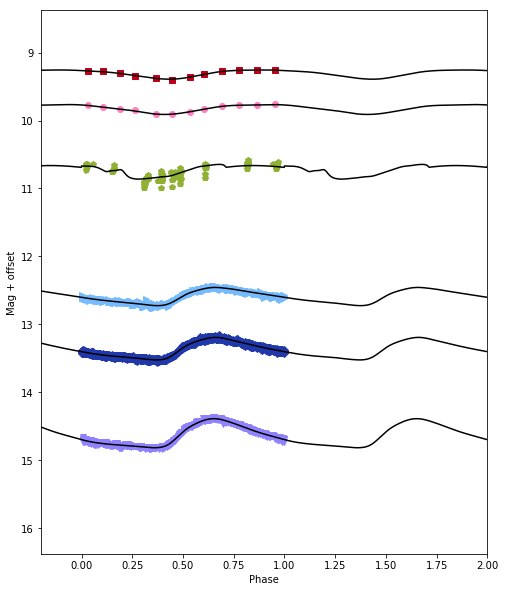

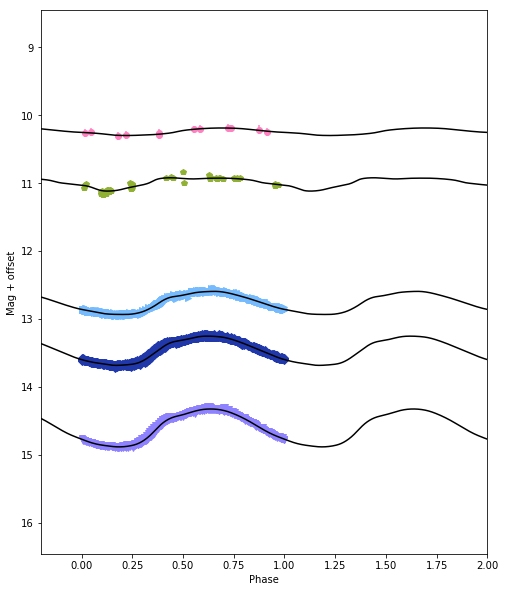

...

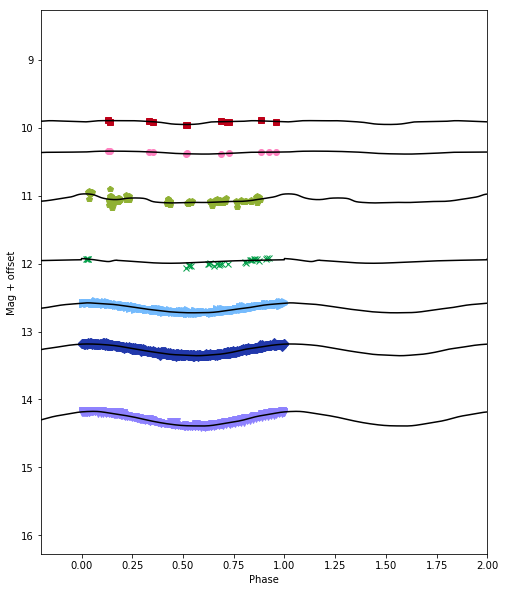

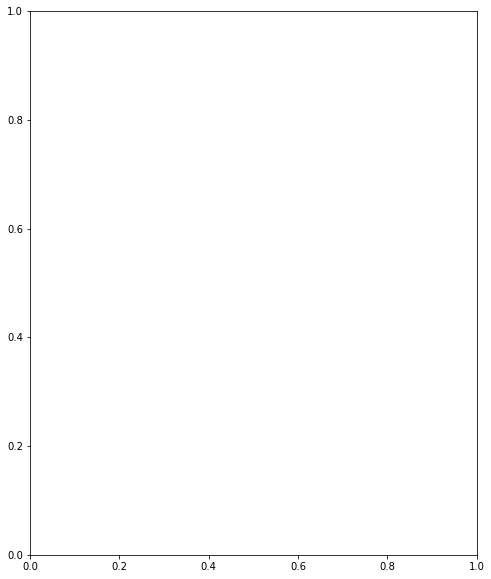

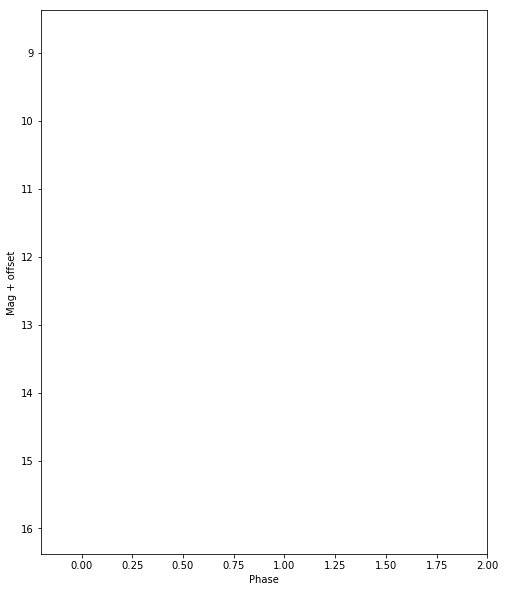

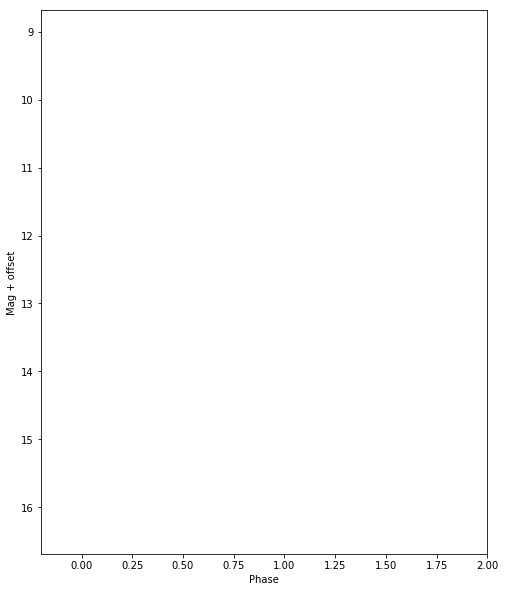

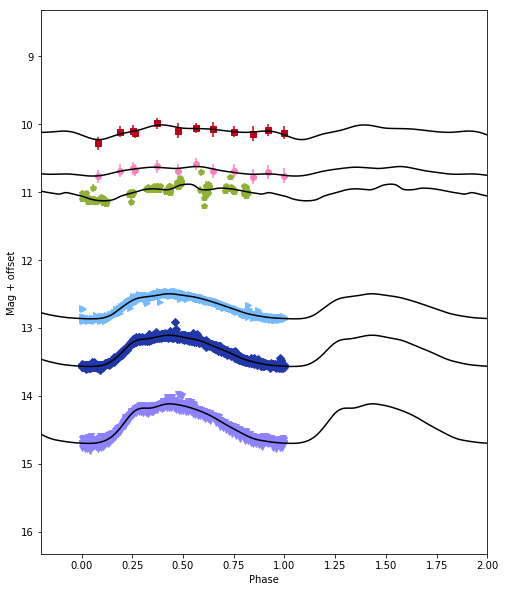

In [6]:
dtype1 = np.dtype([('id', 'S10'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
f = open(folder+'avg_mags-m.txt', 'w')

for ind, star in enumerate(data['id']):

    if np.isnan(data['new_period'][ind]) == 1: 
        continue
    try:
        filters, avgmag, err, amp, sigma = lightcurves.gloess(folder+'lcvs/'+star+'.mphased', ask=0, master_plot=1, clean=1, mosaics=1)
        datasave = np.array(zip(np.repeat(star, len(filters)),filters, np.repeat(data['new_period'][ind], len(filters)), avgmag, err, amp, sigma), dtype=[('c1', 'S10'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float), ('c7', float)])
        np.savetxt(f, datasave, fmt='%10s %2s %10.8f %6.3f %6.4f %4.2f %4.2f')
    except:
        continue
f.close()

In [3]:
# Make txt file with all average mags and other info
dtype = np.dtype([('name', 'S10'), ('filter', 'S2'), ('period', float), ('mag', float), ('err', float), 
                 ('amp', float), ('sigma', float)])
avg_mags = np.loadtxt(folder+'avg_mags-m.txt', dtype=dtype)

dtype1 = np.dtype([('id', 'S10'), ('type', 'S6')])
clem = np.loadtxt(folder+target+'-clement.txt', dtype=dtype1, usecols=(0,4))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

f_handle = open(folder+'RRL-avg-mags.txt', 'w')

stars = np.unique(avg_mags['name'])

for star in stars:
    avgs = avg_mags['mag'][avg_mags['name'] == star]
    errs = avg_mags['err'][avg_mags['name'] == star]
    amps = avg_mags['amp'][avg_mags['name'] == star]
    avgs[avgs == 0.0] = 99.999
    errs[errs == 0.0] = 9.999
    amps[amps == 0.0] = 9.99
    period = avg_mags['period'][avg_mags['name'] == star][0]
    vtype = clem['type'][clem['id'] == star]
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdist = catalog_data['rad_dist'][catalog_data['id'] == dao_id[0]]
  
    dtype2 = np.dtype([('c1', 'S10'), ('c2', float), ('c3', 'S6'), ('c4', float), ('c5', float), 
                    ('c6', float), ('c7', float), ('c8', float), ('c9', float), ('c10', float),
                    ('c11', float), ('c12', float), ('c13', float), ('c14', float), ('c15', float),
                    ('c16', float), ('c17', float), ('c18', float), ('c19', float), ('c20', float),
                    ('c21', float), ('c22', float), ('c23', float), ('c24', float), ('c25', float),
                    ('c26', float), ('c27', float), ('c28', float), ('c29', float), ('c30', float),
                    ('c31', float), ('c32', float), ('c33', float), ('c34', float)])
    #data = np.array([star, period, vtype[0]], dtype=object)
    data = np.zeros(1, dtype=dtype2)
    data[0][0] = star
    data[0][1] = period
    data[0][2] = vtype[0]
    data[0][3] = rdist[0]
    for ind, a in enumerate(avgs):
        data[0][3*(ind+1)+1] = a
        data[0][3*(ind+1)+2] = errs[ind]
        data[0][3*(ind+1)+3] = amps[ind]
    np.savetxt(f_handle, data, fmt='%10s %.8f %6s %8.2f '+'%6.3f %5.3f %4.2f '*10)

f_handle.close()

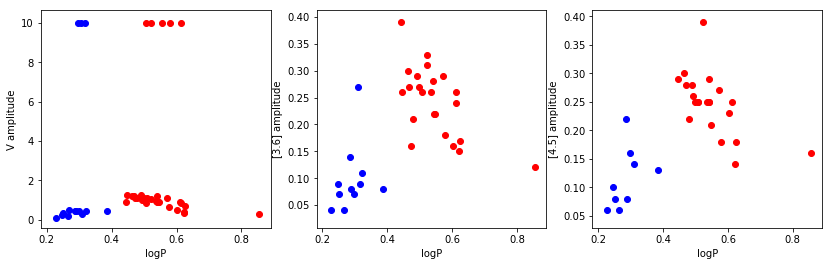

In [3]:
# bailey diagrams  
dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)


fig1 = mp.figure(figsize=(14,4))
ax1 = fig1.add_subplot(131)
ax1.scatter(data['period'][data['type'] == 'RR1'], data['Vamp'][data['type'] == 'RR1'], color='b')
ax1.scatter(data['period'][data['type'] == 'RR0'], data['Vamp'][data['type'] == 'RR0'], color='r')
unknownp = data['period'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
unknownV = data['Vamp'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
ax1.scatter(unknownp, unknownV, color='g')
ax1.set_xlabel('logP')
ax1.set_ylabel('V amplitude')
#for label, x, y in zip(data['name'], data['period'], data['Vamp']):
#    ax1.annotate(label, xy=(x, y))


rrc_3p6_period = data['period'][data['type'] == 'RR1']
rrab_3p6_period = data['period'][data['type'] == 'RR0'] 
rrc_3p6 = data['3.6amp'][data['type'] == 'RR1']
rrab_3p6 = data['3.6amp'][data['type'] == 'RR0'] 
rrc_4p5_period = data['period'][data['type'] == 'RR1']
rrab_4p5_period = data['period'][data['type'] == 'RR0'] 
rrc_4p5 = data['4.5amp'][data['type'] == 'RR1']
rrab_4p5 = data['4.5amp'][data['type'] == 'RR0'] 

#fig2 = mp.figure(figsize=(14,6))
ax2 = fig1.add_subplot(132)
ax2.scatter(rrc_3p6_period[rrc_3p6 < 9], rrc_3p6[rrc_3p6 < 9], color='b')
ax2.scatter(rrab_3p6_period[rrab_3p6 < 9], rrab_3p6[rrab_3p6 < 9], color='r')
ax2.set_xlabel('logP')
ax2.set_ylabel('[3.6] amplitude')

ax3 = fig1.add_subplot(133)
ax3.scatter(rrc_4p5_period[rrc_4p5 < 9], rrc_4p5[rrc_4p5 < 9], color='b')
ax3.scatter(rrab_4p5_period[rrab_4p5 < 9], rrab_4p5[rrab_4p5 < 9], color='r')
ax3.set_xlabel('logP')
ax3.set_ylabel('[4.5] amplitude')

mp.savefig(folder+target+'-bailey.eps', format='eps')

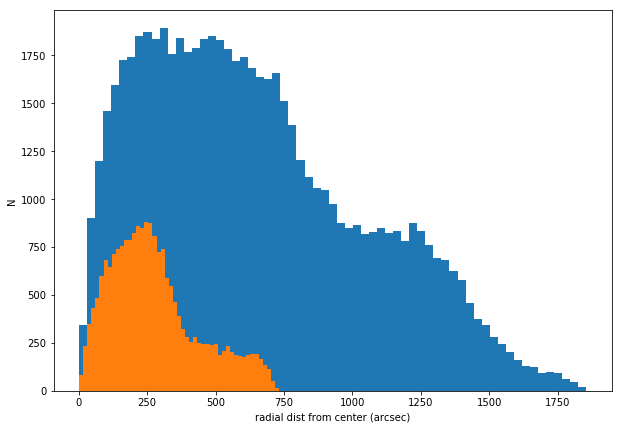

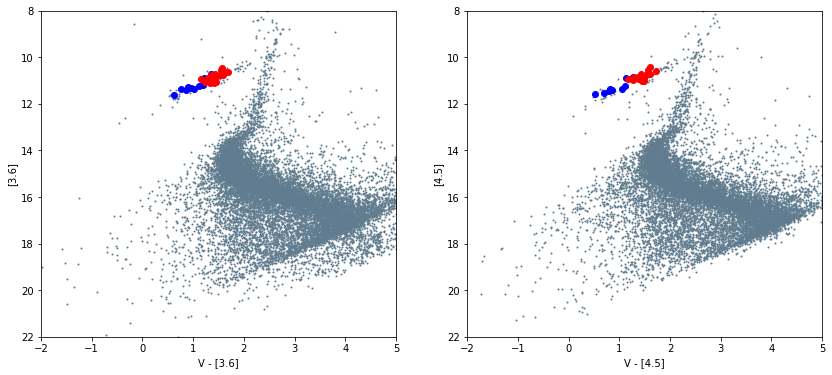

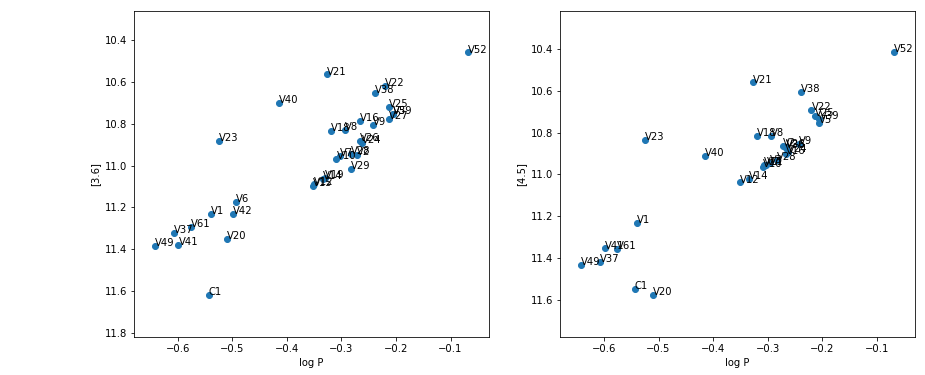

In [7]:
catalog_data = analysis_routines.read_merged_catalog(folder)

# apply extinction
catalog_data['V'] = catalog_data['V'] - Rv*ebv*red_law[0]
catalog_data['3.6'] = catalog_data['3.6'] - Rv*ebv*red_law[1]
catalog_data['4.5'] = catalog_data['4.5'] - Rv*ebv*red_law[2]

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
color1 = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
mag1 = catalog_data['3.6'][dist > thres2]
err1 = catalog_data['3.6er'][dist > thres2]
color2 = catalog_data['V'][dist > thres2] - catalog_data['4.5'][dist > thres2]
mag2 = catalog_data['4.5'][dist > thres2]
err2 = catalog_data['4.5er'][dist > thres2]

dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)

# apply extinction
data['V'] = data['V'] - Rv*ebv*red_law[0]
data['3.6'] = data['3.6'] - Rv*ebv*red_law[1]
data['4.5'] = data['4.5'] - Rv*ebv*red_law[2]

histfig = mp.figure(figsize=(10,7))
ax1 = histfig.add_subplot(111)
ax1.hist(dist, bins='auto')  
n, bins, patches = ax1.hist(dist[catalog_data['3.6'] < 90], bins='auto')
#print bins[np.argmax(n)/3]
#ax1.plot([bins[np.argmax(n)/3], bins[np.argmax(n)/3]], [0,3500])
ax1.set_xlabel('radial dist from center (arcsec)')
ax1.set_ylabel('N')

# CMD 

#cm = mp.cm.get_cmap('RdYlBu')  

fig1 = mp.figure(figsize=(14,6))
ax1 = fig1.add_subplot(121)
ax1.scatter(color1, mag1, s=1, edgecolor=None, color='xkcd:blue grey')
ax1.set_ylim((22,8))
ax1.set_xlim((-2,5))
ax1.set_xlabel('V - [3.6]')
ax1.set_ylabel('[3.6]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax1.scatter(data['V'][rrc] - data['3.6'][rrc], data['3.6'][rrc], color='b') 
ax1.scatter(data['V'][rrab] - data['3.6'][rrab], data['3.6'][rrab], color='r')
ax1.scatter(data['V'][rrcab] - data['3.6'][rrcab], data['3.6'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['3.6'], data['3.6']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
    
ax2 = fig1.add_subplot(122)
ax2.scatter(color2, mag2, s=1, edgecolor=None, color='xkcd:blue grey')
ax2.set_ylim((22,8))
ax2.set_xlim((-2,5))
ax2.set_xlabel('V - [4.5]')
ax2.set_ylabel('[4.5]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax2.scatter(data['V'][rrc] - data['4.5'][rrc], data['4.5'][rrc], color='b') 
ax2.scatter(data['V'][rrab] - data['4.5'][rrab], data['4.5'][rrab], color='r')
ax2.scatter(data['V'][rrcab] - data['4.5'][rrcab], data['4.5'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['4.5'], data['4.5']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
mp.savefig(folder+target+'-cmd.eps', format='eps')

fig2 = mp.figure(figsize=(14,6))
ax1 = fig2.add_subplot(121)
ax1.scatter(np.log10(data['period']), data['3.6']) 
ax1.set_ylim((np.max(data['3.6'][data['3.6'] < 90])+0.2, np.min(data['3.6'][data['3.6'] < 90])-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
for label, x, y in zip(data['name'], np.log10(data['period']), data['3.6']):
    ax1.annotate(label, xy=(x, y))

ax2 = fig2.add_subplot(122)
ax2.scatter(np.log10(data['period']), data['4.5']) 
ax2.set_ylim((np.max(data['4.5'][data['4.5'] < 90])+0.2, np.min(data['4.5'][data['4.5'] < 90])-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')
for label, x, y in zip(data['name'], np.log10(data['period']), data['4.5']):
    ax2.annotate(label, xy=(x, y))

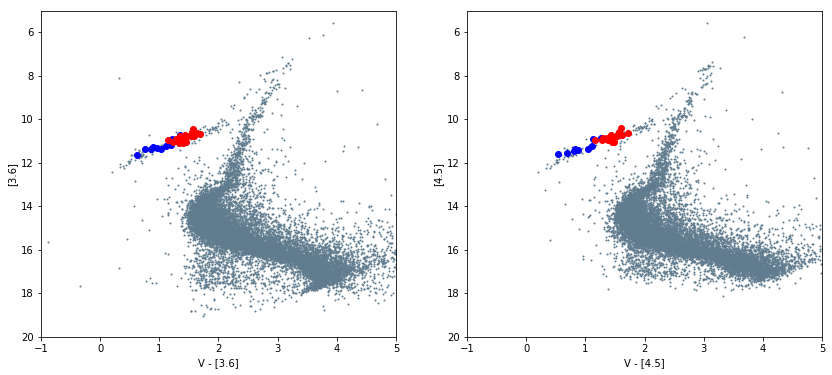

In [4]:
# Peter's photometry
dtype = np.dtype([('id', int), ('x', float), ('y', float), ('V', float), ('Ver', float), ('B', float), 
                 ('Ber', float), ('I', float), ('Ier', float), ('R', float), ('Rer', float), 
                 ('U', float), ('Uer', float), ('J', float), ('Jer', float), ('H', float), ('Her', float), 
                 ('K', float), ('Ker', float), ('L', float), ('Ler', float), ('M', float), ('Mer', float), 
                 ('3.6', float), ('I1er', float), ('4.5', float), ('I2er', float), 
                 ('I3', float), ('I3er', float), ('I4', float), ('I4er', float), ('ra', float), ('dec', float)])
catalog_data = np.loadtxt(folder+'/m4cat_peter.dat', dtype=dtype)

# apply extinction
catalog_data['V'] = catalog_data['V'] - Rv*ebv*red_law[0]
catalog_data['3.6'] = catalog_data['3.6'] - Rv*ebv*red_law[1]
catalog_data['4.5'] = catalog_data['4.5'] - Rv*ebv*red_law[2]

thres = 300
thres2 = 150
#dist = catalog_data['rad_dist']
#color1 = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
#mag = catalog_data['V'][dist > thres2]
#mag1 = catalog_data['3.6'][dist > thres2]
#err1 = catalog_data['3.6er'][dist > thres2]
#color2 = catalog_data['V'][dist > thres2] - catalog_data['4.5'][dist > thres2]
#mag2 = catalog_data['4.5'][dist > thres2]
#err2 = catalog_data['4.5er'][dist > thres2]
color1 = catalog_data['V'] - catalog_data['3.6']
color2 = catalog_data['V'] - catalog_data['4.5']

dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)

# apply extinction
data['V'] = data['V'] - Rv*ebv*red_law[0]
data['3.6'] = data['3.6'] - Rv*ebv*red_law[1]
data['4.5'] = data['4.5'] - Rv*ebv*red_law[2]

# CMD 

fig1 = mp.figure(figsize=(14,6))
ax1 = fig1.add_subplot(121)
ax1.scatter(color1, catalog_data['3.6'], s=1, edgecolor=None, color='xkcd:blue grey')
ax1.set_ylim((20,5))
ax1.set_xlim((-1,5))
ax1.set_xlabel('V - [3.6]')
ax1.set_ylabel('[3.6]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax1.scatter(data['V'][rrc] - data['3.6'][rrc], data['3.6'][rrc], color='b') 
ax1.scatter(data['V'][rrab] - data['3.6'][rrab], data['3.6'][rrab], color='r')
ax1.scatter(data['V'][rrcab] - data['3.6'][rrcab], data['3.6'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['3.6'], data['3.6']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
    
ax2 = fig1.add_subplot(122)
ax2.scatter(color2, catalog_data['4.5'], s=1, edgecolor=None, color='xkcd:blue grey')
ax2.set_ylim((20,5))
ax2.set_xlim((-1,5))
ax2.set_xlabel('V - [4.5]')
ax2.set_ylabel('[4.5]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax2.scatter(data['V'][rrc] - data['4.5'][rrc], data['4.5'][rrc], color='b') 
ax2.scatter(data['V'][rrab] - data['4.5'][rrab], data['4.5'][rrab], color='r')
ax2.scatter(data['V'][rrcab] - data['4.5'][rrcab], data['4.5'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['4.5'], data['4.5']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
mp.savefig(folder+target+'-cmd2.eps', format='eps')


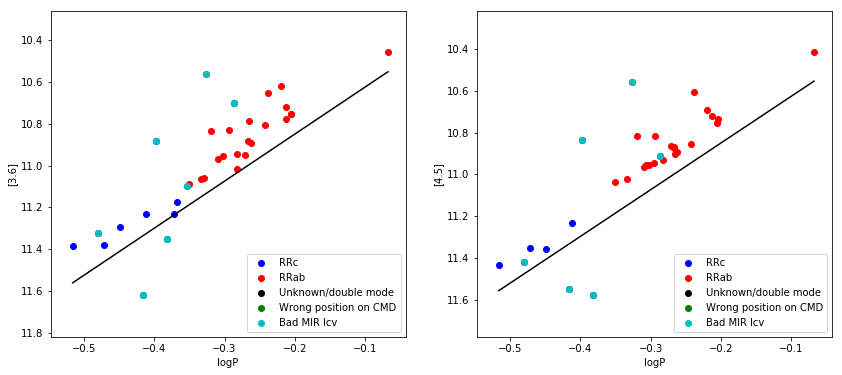

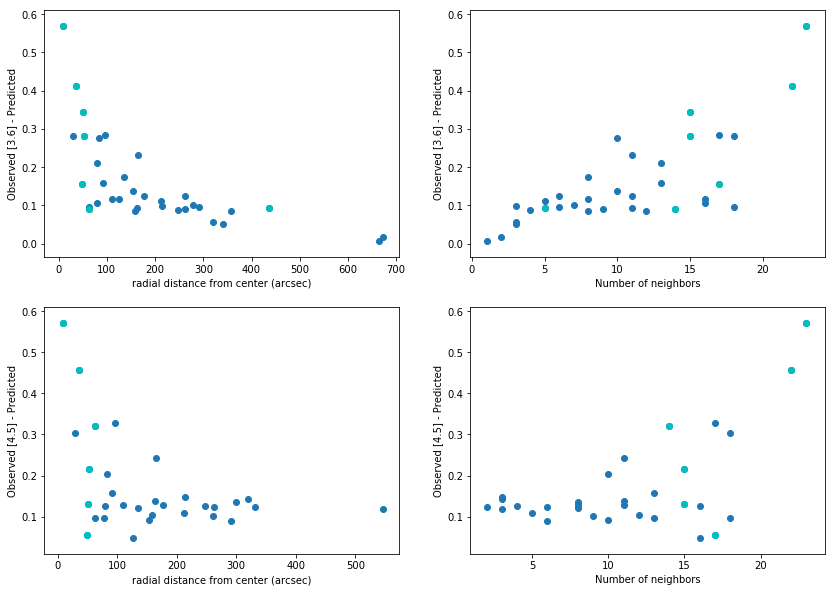

In [8]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

mag1 = data['3.6'][~np.isnan(data['period'])]
mag2 = data['4.5'][~np.isnan(data['period'])]
err1 = data['3.6er'][~np.isnan(data['period'])]
err2 = data['4.5er'][~np.isnan(data['period'])]
id1 = data['name'][~np.isnan(data['period'])]
id2 = data['name'][~np.isnan(data['period'])]
mode1 = data['type'][~np.isnan(data['period'])]
mode2 = data['type'][~np.isnan(data['period'])]
logP1 = np.log10(data['period'][~np.isnan(data['period'])])
logP2 = np.log10(data['period'][~np.isnan(data['period'])])
dist1 = data['dist'][~np.isnan(data['period'])]
dist2 = data['dist'][~np.isnan(data['period'])]

cat_ra, cat_dec = coordinates.hms2deg(catalog_data['ra_h'], catalog_data['ra_m'], 
                                      catalog_data['ra_s'], catalog_data['dec_d'], 
                                      catalog_data['dec_m'], catalog_data['dec_s'])
# calculate the number of stars within 8 pixels of each RRL
N_neigh1 = np.zeros(len(id1))
for ind, star in enumerate(id1):
    # find neighbors
    # need to find coordinates of the RRL 
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    RRL_ra = cat_ra[catalog_data['id'] == dao_id[0]]
    RRL_dec = cat_dec[catalog_data['id'] == dao_id[0]]
    d = coordinates.radial_dist(RRL_ra, RRL_dec, cat_ra, cat_dec)
    N_neigh1[ind] = len(d[d < 8.0])
N_neigh2 = np.copy(N_neigh1)

# Get rid of stars with no data
err1 = err1[mag1 < 90]
id1 = id1[mag1 < 90]
mode1 = mode1[mag1 < 90]
logP1 = logP1[mag1 < 90]
dist1 = dist1[mag1 < 90]
N_neigh1 = N_neigh1[mag1 < 90]
mag1 = mag1[mag1 < 90]
err2 = err2[mag2 < 90]
id2 = id2[mag2 < 90]
mode2 = mode2[mag2 < 90]
logP2 = logP2[mag2 < 90]
dist2 = dist2[mag2 < 90]
N_neigh2 = N_neigh2[mag2 < 90]
mag2 = mag2[mag2 < 90]

fun_logP1 = np.copy(logP1)
fun_logP2 = np.copy(logP2)
fun_logP1[mode1 == 'RR1'] += 0.127
fun_logP2[mode2 == 'RR1'] += 0.127

# Double mode RRL
double1 = id1[(mode1 != 'RR0') & (mode1 != 'RR1')]
double2 = id2[(mode2 != 'RR0') & (mode2 != 'RR1')]
mask_double1 = np.in1d(id1, double1)
mask_double2 = np.in1d(id2, double2)

# Stars in the wrong place on the CMD
bad_cmd1 = []
bad_cmd2 = []
mask_cmd1 = np.in1d(id1, bad_cmd1)
mask_cmd2 = np.in1d(id2, bad_cmd2)

# Other stars with bad MIR lcvs
#bad_lcv2 = 
bad_lcv1 = ['C1', 'V20', 'V21', 'V23', 'V37', 'V40', 'V15']
bad_lcv2 = ['C1', 'V20', 'V21', 'V23', 'V37', 'V40']
mask_lcv1 = np.in1d(id1, bad_lcv1)
mask_lcv2 = np.in1d(id2, bad_lcv2)


# Theoretical relation
fun_x1 = np.array([np.min(fun_logP1), np.max(fun_logP1)])
fun_x2 = np.array([np.min(fun_logP2), np.max(fun_logP2)])

plz1 = -2.251*fun_logP1 + 0.180*feh - 0.793 + mu
plz2 = -2.239*fun_logP2 + 0.185*feh - 0.785 + mu
plz_line1 = -2.251*fun_x1 + 0.180*feh - 0.793 + mu
plz_line2 = -2.239*fun_x2 + 0.185*feh - 0.785 + mu

# Plot PL relations with theoretical PLZ line
fig1 = mp.figure(figsize=(14,6))
ax1 = fig1.add_subplot(121)
ax1.scatter(fun_logP1[mode1 == 'RR1'], mag1[mode1 == 'RR1'], color='b', label='RRc')
ax1.scatter(fun_logP1[mode1 == 'RR0'], mag1[mode1 == 'RR0'], color='r', label='RRab')
ax1.scatter(fun_logP1[mask_double1], mag1[mask_double1], color='k', label='Unknown/double mode')
ax1.scatter(fun_logP1[mask_cmd1], mag1[mask_cmd1], color='g', label='Wrong position on CMD')
ax1.scatter(fun_logP1[mask_lcv1], mag1[mask_lcv1], color='c', label='Bad MIR lcv')
ax1.plot(fun_x1, plz_line1, 'k-')
ax1.set_ylim(np.max(mag1)+0.2, np.min(mag1)-0.2)
ax1.set_xlabel('logP')
ax1.set_ylabel('[3.6]')
ax1.legend(loc='lower right')

ax2 = fig1.add_subplot(122)
ax2.scatter(fun_logP2[mode2 == 'RR1'], mag2[mode2 == 'RR1'], color='b', label='RRc')
ax2.scatter(fun_logP2[mode2 == 'RR0'], mag2[mode2 == 'RR0'], color='r', label='RRab')
ax2.scatter(fun_logP2[mask_double2], mag2[mask_double2], color='k', label='Unknown/double mode')
ax2.scatter(fun_logP2[mask_cmd2], mag2[mask_cmd2], color='g', label='Wrong position on CMD')
ax2.scatter(fun_logP2[mask_lcv2], mag2[mask_lcv2], color='c', label='Bad MIR lcv')
ax2.plot(fun_x2, plz_line2, 'k-')
ax2.set_ylim(np.max(mag2)+0.2, np.min(mag2)-0.2)
ax2.set_xlabel('logP')
ax2.set_ylabel('[4.5]')
ax2.legend(loc='lower right')
mp.savefig(folder+target+'-pl-raw.eps', format='eps')
residuals1 = np.abs(mag1 - plz1)
residuals2 = np.abs(mag2 - plz2)

# plot residuals from PLZ vs radial dist and number of neighbors
fig2 = mp.figure(figsize=(14,10))
ax1 = fig2.add_subplot(221)
ax1.scatter(dist1, residuals1)
ax1.scatter(dist1[mask_double1], residuals1[mask_double1], color='k', label='Unknown/double mode')
ax1.scatter(dist1[mask_cmd1], residuals1[mask_cmd1], color='g', label='Wrong position on CMD')
ax1.scatter(dist1[mask_lcv1], residuals1[mask_lcv1], color='c', label='Bad MIR lcv')
ax1.set_xlabel('radial distance from center (arcsec)')
ax1.set_ylabel('Observed [3.6] - Predicted')
ax2 = fig2.add_subplot(222)
ax2.scatter(N_neigh1, residuals1)
ax2.scatter(N_neigh1[mask_double1], residuals1[mask_double1], color='k', label='Unknown/double mode')
ax2.scatter(N_neigh1[mask_cmd1], residuals1[mask_cmd1], color='g', label='Wrong position on CMD')
ax2.scatter(N_neigh1[mask_lcv1], residuals1[mask_lcv1], color='c', label='Bad MIR lcv')
ax2.set_xlabel('Number of neighbors')
ax2.set_ylabel('Observed [3.6] - Predicted')
ax3 = fig2.add_subplot(223)
ax3.scatter(dist2, residuals2)
ax3.scatter(dist2[mask_double2], residuals2[mask_double2], color='k', label='Unknown/double mode')
ax3.scatter(dist2[mask_cmd2], residuals2[mask_cmd2], color='g', label='Wrong position on CMD')
ax3.scatter(dist2[mask_lcv2], residuals2[mask_lcv2], color='c', label='Bad MIR lcv')
ax3.set_xlabel('radial distance from center (arcsec)')
ax3.set_ylabel('Observed [4.5] - Predicted')
ax4 = fig2.add_subplot(224)
ax4.scatter(N_neigh2, residuals2)
ax4.scatter(N_neigh2[mask_double2], residuals2[mask_double2], color='k', label='Unknown/double mode')
ax4.scatter(N_neigh2[mask_cmd2], residuals2[mask_cmd2], color='g', label='Wrong position on CMD')
ax4.scatter(N_neigh2[mask_lcv2], residuals2[mask_lcv2], color='c', label='Bad MIR lcv')
ax4.set_xlabel('Number of neighbors')
ax4.set_ylabel('Observed [4.5] - Predicted')

Using the following stars in [3.6]: 
['V1' 'V10' 'V12' 'V14' 'V16' 'V18' 'V19' 'V2' 'V22' 'V24' 'V25' 'V26'
 'V27' 'V28' 'V29' 'V38' 'V39' 'V41' 'V42' 'V49' 'V5' 'V52' 'V6' 'V61' 'V7'
 'V8' 'V9']
Using the following stars in [4.5]: 
['V1' 'V10' 'V11' 'V12' 'V14' 'V16' 'V18' 'V2' 'V22' 'V24' 'V25' 'V26'
 'V28' 'V3' 'V36' 'V38' 'V39' 'V41' 'V49' 'V5' 'V52' 'V61' 'V7' 'V8' 'V9']
[3.6] RRc fit: -1.389 (+- 0.233) logP + 10.506 (+- 0.131) 
      dispersion: 0.009
[3.6] RRab fit: -2.261 (+- 0.277) logP + 10.259 (+- 0.074) 
      dispersion: 0.044
[4.5] RRc fit: -1.825 (+- 0.408) logP + 10.270 (+- 0.241) 
      dispersion: 0.012
[4.5] RRab fit: -2.173 (+- 0.245) logP + 10.268 (+- 0.066) 

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)



      dispersion: 0.044
[3.6] FUN fit: -2.360 (+- 0.155) logP + 10.240 (+- 0.048) 
      dispersion: 0.046
[4.5] FUN fit: -2.394 (+- 0.139) logP + 10.215 (+- 0.043) 
      dispersion: 0.045



Cutting central 12 arcsec: 

[3.6] RRc fit: -1.389 (+- 0.233) logP + 10.506 (+- 0.131) 
      dispersion: 0.009
[3.6] RRab fit: -2.261 (+- 0.277) logP + 10.259 (+- 0.074) 
      dispersion: 0.044
[4.5] RRc fit: -1.825 (+- 0.408) logP + 10.270 (+- 0.241) 
      dispersion: 0.012
[4.5] RRab fit: -2.173 (+- 0.245) logP + 10.268 (+- 0.066) 
      dispersion: 0.044
[3.6] FUN fit: -2.360 (+- 0.155) logP + 10.240 (+- 0.048) 
      dispersion: 0.046
[4.5] FUN fit: -2.394 (+- 0.139) logP + 10.215 (+- 0.043) 
      dispersion: 0.045


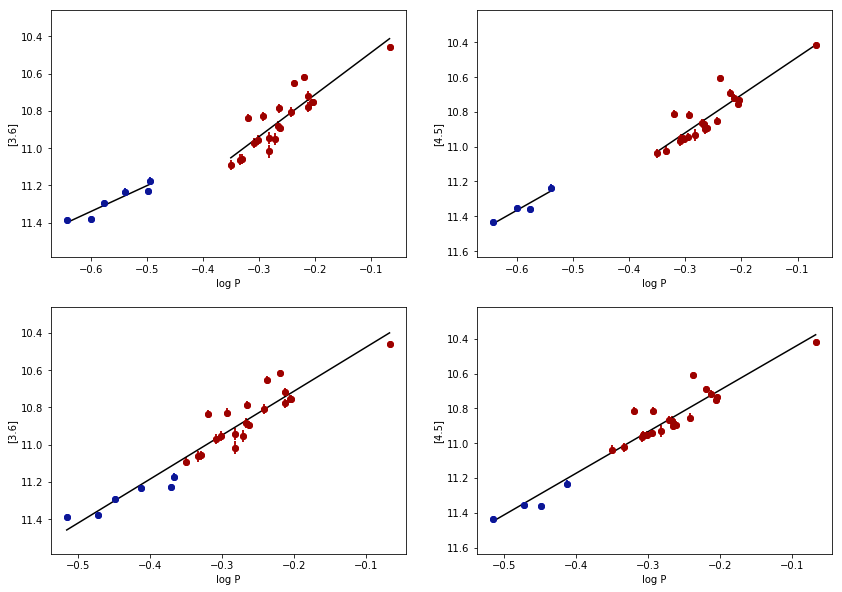

In [9]:
m_id1 = ma.array(id1)
m_logP1 = ma.array(logP1)
m_mag1 = ma.array(mag1)
m_err1 = ma.array(err1)
m_funP1 = ma.array(fun_logP1)
m_id1[mask_double1] = ma.masked
m_id1[mask_cmd1] = ma.masked
m_id1[mask_lcv1] = ma.masked
m_logP1[mask_double1] = ma.masked
m_logP1[mask_cmd1] = ma.masked
m_logP1[mask_lcv1] = ma.masked
m_mag1[mask_double1] = ma.masked
m_mag1[mask_cmd1] = ma.masked
m_mag1[mask_lcv1] = ma.masked
m_err1[mask_double1] = ma.masked
m_err1[mask_cmd1] = ma.masked
m_err1[mask_lcv1] = ma.masked
m_funP1[mask_double1] = ma.masked
m_funP1[mask_cmd1] = ma.masked
m_funP1[mask_lcv1] = ma.masked

m_id2 = ma.array(id2)
m_logP2 = ma.array(logP2)
m_mag2 = ma.array(mag2)
m_err2 = ma.array(err2)
m_funP2 = ma.array(fun_logP2)
m_id2[mask_double2] = ma.masked
m_id2[mask_cmd2] = ma.masked
m_id2[mask_lcv2] = ma.masked
m_logP2[mask_double2] = ma.masked
m_logP2[mask_cmd2] = ma.masked
m_logP2[mask_lcv2] = ma.masked
m_mag2[mask_double2] = ma.masked
m_mag2[mask_cmd2] = ma.masked
m_mag2[mask_lcv2] = ma.masked
m_err2[mask_double2] = ma.masked
m_err2[mask_cmd2] = ma.masked
m_err2[mask_lcv2] = ma.masked
m_funP2[mask_double2] = ma.masked
m_funP2[mask_cmd2] = ma.masked
m_funP2[mask_lcv2] = ma.masked

thresh = 12
good_logP1 = m_logP1[dist1 > thresh]
good_mag1 = m_mag1[dist1 > thresh]
good_err1 = m_err1[dist1 > thresh]
good_id1 = m_id1[dist1 > thresh]
good_mode1 = mode1[dist1 > thresh]
good_funP1 = m_funP1[dist1 > thresh]

good_logP2 = m_logP2[dist2 > thresh]
good_mag2 = m_mag2[dist2 > thresh]
good_err2 = m_err2[dist2 > thresh]
good_id2 = m_id2[dist2 > thresh]
good_mode2 = mode2[dist2 > thresh]
good_funP2 = m_funP2[dist2 > thresh]


print 'Using the following stars in [3.6]: '
print good_id1.compressed()
print 'Using the following stars in [4.5]: '
print good_id2.compressed()

fig1 = mp.figure(figsize=(14,10))
ax1 = fig1.add_subplot(221)
rrc = mode1 == 'RR1'
good_rrc = good_mode1 == 'RR1'
rrab = mode1 == 'RR0'
good_rrab = good_mode1 == 'RR0'
ax1.errorbar(m_logP1[rrc], m_mag1[rrc], yerr=m_err1[rrc], fmt='o', color='b', mfc='none')
ax1.errorbar(good_logP1[good_rrc], good_mag1[good_rrc], yerr=good_err1[good_rrc], fmt='o', color='xkcd:royal')
ax1.errorbar(m_logP1[rrab], m_mag1[rrab], yerr=m_err1[rrab], fmt='o', color='r', mfc='none')
ax1.errorbar(good_logP1[good_rrab], good_mag1[good_rrab], yerr=good_err1[good_rrab], fmt='o', color='xkcd:deep red')
ax1.set_ylim((np.max(good_mag1)+0.2, np.min(good_mag1)-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')

# fit separate [3.6] relations
X = sm.add_constant(m_logP1[rrc].compressed())
fit1_rrc = sm.OLS(m_mag1[rrc].compressed(), X).fit()
X = sm.add_constant(m_logP1[rrab].compressed())
fit1_rrab = sm.OLS(m_mag1[rrab].compressed(), X).fit()
x = np.array([np.min(m_logP1[rrc]), np.max(m_logP1[rrc])])
y = fit1_rrc.params[0] + fit1_rrc.params[1]*x
#ax1.plot(x, y, 'k-')
x = np.array([np.min(m_logP1[rrab]), np.max(m_logP1[rrab])])
y = fit1_rrab.params[0] + fit1_rrab.params[1]*x
#ax1.plot(x, y, 'k-')
residuals1_rrc = m_mag1[rrc].compressed() - fit1_rrc.predict()
std1_rrc = np.std(np.abs(residuals1_rrc))
residuals1_rrab = m_mag1[rrab].compressed() - fit1_rrab.predict()
std1_rrab = np.std(np.abs(residuals1_rrab))

X = sm.add_constant(good_logP1[good_rrc].compressed())
fit1_grrc = sm.OLS(good_mag1[good_rrc].compressed(), X).fit()
X = sm.add_constant(good_logP1[good_rrab].compressed())
fit1_grrab = sm.OLS(good_mag1[good_rrab].compressed(), X).fit()
x = np.array([np.min(good_logP1[good_rrc]), np.max(good_logP1[good_rrc])])
y = fit1_grrc.params[0] + fit1_grrc.params[1]*x
ax1.plot(x, y, 'k-')
x = np.array([np.min(good_logP1[good_rrab]), np.max(good_logP1[good_rrab])])
y = fit1_grrab.params[0] + fit1_grrab.params[1]*x
ax1.plot(x, y, 'k-')
residuals1_grrc = good_mag1[good_rrc].compressed() - fit1_grrc.predict()
std1_grrc = np.std(np.abs(residuals1_grrc))
residuals1_grrab = good_mag1[good_rrab].compressed() - fit1_grrab.predict()
std1_grrab = np.std(np.abs(residuals1_grrab))
print '[3.6] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_rrc.params[1], fit1_rrc.bse[1], fit1_rrc.params[0], fit1_rrc.bse[0])
print '      dispersion: {:.3f}'.format(std1_rrc)
print '[3.6] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_rrab.params[1], fit1_rrab.bse[1], fit1_rrab.params[0], fit1_rrab.bse[0])
print '      dispersion: {:.3f}'.format(std1_rrab)

ax2 = fig1.add_subplot(222)
rrc = mode2 == 'RR1'
good_rrc = good_mode2 == 'RR1'
rrab = mode2 == 'RR0'
good_rrab = good_mode2 == 'RR0'
ax2.errorbar(m_logP2[rrc], m_mag2[rrc], yerr=m_err2[rrc], fmt='o', color='b', mfc='none')
ax2.errorbar(good_logP2[good_rrc], good_mag2[good_rrc], yerr=good_err2[good_rrc], fmt='o', color='xkcd:royal')
ax2.errorbar(m_logP2[rrab], m_mag2[rrab], yerr=m_err2[rrab], fmt='o', color='r', mfc='none')
ax2.errorbar(good_logP2[good_rrab], good_mag2[good_rrab], yerr=good_err2[good_rrab], fmt='o', color='xkcd:deep red')
ax2.set_ylim((np.max(good_mag2)+0.2, np.min(good_mag2)-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

# fit separate [4.5] relations
X = sm.add_constant(m_logP2[rrc].compressed())
fit2_rrc = sm.OLS(m_mag2[rrc].compressed(), X).fit()
X = sm.add_constant(m_logP2[rrab].compressed())
fit2_rrab = sm.OLS(m_mag2[rrab].compressed(), X).fit()
x = np.array([np.min(m_logP2[rrc]), np.max(m_logP2[rrc])])
y = fit2_rrc.params[0] + fit2_rrc.params[1]*x
#ax2.plot(x, y, 'k-')
x = np.array([np.min(m_logP2[rrab]), np.max(m_logP2[rrab])])
y = fit2_rrab.params[0] + fit2_rrab.params[1]*x
#ax2.plot(x, y, 'k-')
residuals2_rrc = m_mag2[rrc].compressed() - fit2_rrc.predict()
std2_rrc = np.std(np.abs(residuals2_rrc))
residuals2_rrab = m_mag2[rrab].compressed() - fit2_rrab.predict()
std2_rrab = np.std(np.abs(residuals2_rrab))

X = sm.add_constant(good_logP2[good_rrc].compressed())
fit2_grrc = sm.OLS(good_mag2[good_rrc].compressed(), X).fit()
X = sm.add_constant(good_logP2[good_rrab].compressed())
fit2_grrab = sm.OLS(good_mag2[good_rrab].compressed(), X).fit()
x = np.array([np.min(good_logP2[good_rrc]), np.max(good_logP2[good_rrc])])
y = fit2_grrc.params[0] + fit2_grrc.params[1]*x
ax2.plot(x, y, 'k-')
x = np.array([np.min(good_logP2[good_rrab]), np.max(good_logP2[good_rrab])])
y = fit2_grrab.params[0] + fit2_grrab.params[1]*x
ax2.plot(x, y, 'k-')
residuals2_grrc = good_mag2[good_rrc].compressed() - fit2_grrc.predict()
std2_grrc = np.std(np.abs(residuals2_grrc))
residuals2_grrab = good_mag2[good_rrab].compressed() - fit2_grrab.predict()
std2_grrab = np.std(np.abs(residuals2_grrab))
print '[4.5] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_rrc.params[1], fit2_rrc.bse[1], fit2_rrc.params[0], fit2_rrc.bse[0])
print '      dispersion: {:.3f}'.format(std2_rrc)
print '[4.5] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_rrab.params[1], fit2_rrab.bse[1], fit2_rrab.params[0], fit2_rrab.bse[0])
print '      dispersion: {:.3f}'.format(std2_rrab)

ax3 = fig1.add_subplot(223)
rrc = mode1 == 'RR1'
good_rrc = good_mode1 == 'RR1'
rrab = mode1 == 'RR0'
good_rrab = good_mode1 == 'RR0'
ax3.errorbar(m_funP1[rrc], m_mag1[rrc], yerr=m_err1[rrc], fmt='o', color='b', mfc='none')
ax3.errorbar(good_logP1[good_rrc]+0.127, good_mag1[good_rrc], yerr=good_err1[good_rrc], fmt='o', color='xkcd:royal')
ax3.errorbar(m_funP1[rrab], m_mag1[rrab], yerr=m_err1[rrab], fmt='o', color='r', mfc='none')
ax3.errorbar(good_logP1[good_rrab], good_mag1[good_rrab], yerr=good_err1[good_rrab], fmt='o', color='xkcd:deep red')
ax3.set_ylim((np.max(good_mag1)+0.2, np.min(good_mag1)-0.2))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

# fit fundamentalized [3.6] relation
X = sm.add_constant(m_funP1.compressed())
fit1_fun = sm.OLS(m_mag1.compressed(), X).fit()
x = np.array([np.min(m_funP1), np.max(m_funP1)])
y = fit1_fun.params[0] + fit1_fun.params[1]*x
#ax3.plot(x, y, 'k-')
residuals1_fun = m_mag1.compressed() - fit1_fun.predict()
std1_fun = np.std(np.abs(residuals1_fun))

X = sm.add_constant(good_funP1.compressed())
fit1_gfun = sm.OLS(good_mag1.compressed(), X).fit()
x = np.array([np.min(good_funP1), np.max(good_funP1)])
y = fit1_gfun.params[0] + fit1_gfun.params[1]*x
ax3.plot(x, y, 'k-')
residuals1_gfun = good_mag1.compressed() - fit1_gfun.predict()
std1_gfun = np.std(np.abs(residuals1_gfun))
print '[3.6] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_fun.params[1], fit1_fun.bse[1], fit1_fun.params[0], fit1_fun.bse[0])
print '      dispersion: {:.3f}'.format(std1_fun)

ax4 = fig1.add_subplot(224)
rrc = mode2 == 'RR1'
good_rrc = good_mode2 == 'RR1'
rrab = mode2 == 'RR0'
good_rrab = good_mode2 == 'RR0'
ax4.errorbar(m_funP2[rrc], m_mag2[rrc], yerr=m_err2[rrc], fmt='o', color='b', mfc='none')
ax4.errorbar(good_logP2[good_rrc]+0.127, good_mag2[good_rrc], yerr=good_err2[good_rrc], fmt='o', color='xkcd:royal')
ax4.errorbar(m_funP2[rrab], m_mag2[rrab], yerr=m_err2[rrab], fmt='o', color='r', mfc='none')
ax4.errorbar(good_logP2[good_rrab], good_mag2[good_rrab], yerr=good_err2[good_rrab], fmt='o', color='xkcd:deep red')
ax4.set_ylim((np.max(good_mag2)+0.2, np.min(good_mag2)-0.2))
ax4.set_xlabel('log P')
ax4.set_ylabel('[4.5]')

# fit fundamentalized [4.5] relation
X = sm.add_constant(m_funP2.compressed())
fit2_fun = sm.OLS(m_mag2.compressed(), X).fit()
x = np.array([np.min(m_funP2), np.max(m_funP2)])
y = fit2_fun.params[0] + fit2_fun.params[1]*x
#ax4.plot(x, y, 'k-')
residuals2_fun = m_mag2.compressed() - fit2_fun.predict()
std2_fun = np.std(np.abs(residuals2_fun))

X = sm.add_constant(good_funP2.compressed())
fit2_gfun = sm.OLS(good_mag2.compressed(), X).fit()
x = np.array([np.min(good_funP2), np.max(good_funP2)])
y = fit2_gfun.params[0] + fit2_gfun.params[1]*x
ax4.plot(x, y, 'k-')
residuals2_gfun = good_mag2.compressed() - fit2_gfun.predict()
std2_gfun = np.std(np.abs(residuals2_gfun))
print '[4.5] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_fun.params[1], fit2_fun.bse[1], fit2_fun.params[0], fit2_fun.bse[0])
print '      dispersion: {:.3f}'.format(std2_fun)


print '\n\n\nCutting central {} arcsec: \n'.format(thresh)

print '[3.6] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_grrc.params[1], fit1_grrc.bse[1], fit1_grrc.params[0], fit1_grrc.bse[0])
print '      dispersion: {:.3f}'.format(std1_grrc)
print '[3.6] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_grrab.params[1], fit1_grrab.bse[1], fit1_grrab.params[0], fit1_grrab.bse[0])
print '      dispersion: {:.3f}'.format(std1_grrab)
print '[4.5] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_grrc.params[1], fit2_grrc.bse[1], fit2_grrc.params[0], fit2_grrc.bse[0])
print '      dispersion: {:.3f}'.format(std2_grrc)
print '[4.5] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_grrab.params[1], fit2_grrab.bse[1], fit2_grrab.params[0], fit2_grrab.bse[0])
print '      dispersion: {:.3f}'.format(std2_grrab)
print '[3.6] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_gfun.params[1], fit1_gfun.bse[1], fit1_gfun.params[0], fit1_gfun.bse[0])
print '      dispersion: {:.3f}'.format(std1_gfun)
print '[4.5] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_gfun.params[1], fit2_gfun.bse[1], fit2_gfun.params[0], fit2_gfun.bse[0])
print '      dispersion: {:.3f}'.format(std2_gfun)

mp.savefig(folder+target+'-pl.eps', format='eps')

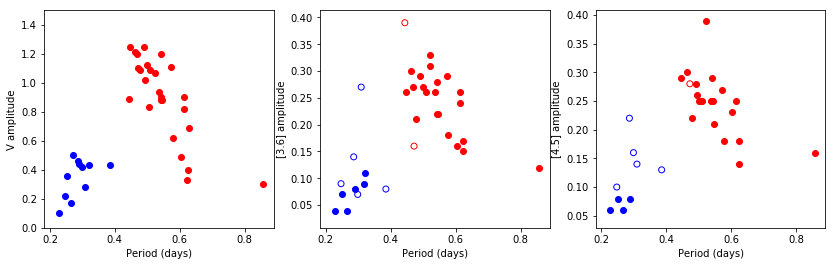

In [12]:
# bailey diagrams  
dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)


fig1 = mp.figure(figsize=(14,4))
ax1 = fig1.add_subplot(131)
ax1.scatter(data['period'][data['type'] == 'RR1'], data['Vamp'][data['type'] == 'RR1'], color='b')
ax1.scatter(data['period'][data['type'] == 'RR0'], data['Vamp'][data['type'] == 'RR0'], color='r')
unknownp = data['period'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
unknownV = data['Vamp'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
ax1.scatter(unknownp, unknownV, color='g')
ax1.set_ylim((0,1.5))
ax1.set_xlabel('Period (days)')
ax1.set_ylabel('V amplitude')
#for label, x, y in zip(data['name'], data['period'], data['Vamp']):
#    ax1.annotate(label, xy=(x, y))

a1 = data['3.6amp'][data['3.6'] < 90]
a2 = data['4.5amp'][data['4.5'] < 90]
p1 = data['period'][data['3.6'] < 90]
p2 = data['period'][data['4.5'] < 90]
m1 = data['type'][data['3.6'] < 90]
m2 = data['type'][data['4.5'] < 90]
n1 = data['name'][data['3.6'] < 90]
n2 = data['name'][data['4.5'] < 90]

used_3p6 = np.in1d(n1, good_id1.compressed())
used_4p5 = np.in1d(n2, good_id2.compressed())
good_period_3p6 = p1[used_3p6 == True]
good_period_4p5 = p2[used_4p5 == True]
good_mode_3p6 = m1[used_3p6 == True]
good_mode_4p5 = m2[used_4p5 == True]
good_amp_3p6 = a1[used_3p6 == True]
good_amp_4p5 = a2[used_4p5 == True]
bad_period_3p6 = p1[used_3p6 == False]
bad_period_4p5 = p2[used_4p5 == False]
bad_mode_3p6 = m1[used_3p6 == False]
bad_mode_4p5 = m2[used_4p5 == False]
bad_amp_3p6 = a1[used_3p6 == False]
bad_amp_4p5 = a2[used_4p5 == False]

good_rrc = good_mode_3p6 == 'RR1'
good_rrab = good_mode_3p6 == 'RR0'
bad_rrc = bad_mode_3p6 == 'RR1'
bad_rrab = bad_mode_3p6 == 'RR0'
#fig2 = mp.figure(figsize=(14,6))
ax2 = fig1.add_subplot(132)
ax2.scatter(good_period_3p6[good_rrc], good_amp_3p6[good_rrc], color='b')
ax2.scatter(good_period_3p6[good_rrab], good_amp_3p6[good_rrab], color='r')
ax2.scatter(bad_period_3p6[bad_rrc], bad_amp_3p6[bad_rrc], color='b', facecolor='none')
ax2.scatter(bad_period_3p6[bad_rrab], bad_amp_3p6[bad_rrab], color='r', facecolor='none')
ax2.set_xlabel('Period (days)')
ax2.set_ylabel('[3.6] amplitude')

good_rrc = good_mode_4p5 == 'RR1'
good_rrab = good_mode_4p5 == 'RR0'
bad_rrc = bad_mode_4p5 == 'RR1'
bad_rrab = bad_mode_4p5 == 'RR0'
ax3 = fig1.add_subplot(133)
ax3.scatter(good_period_4p5[good_rrc], good_amp_4p5[good_rrc], color='b')
ax3.scatter(good_period_4p5[good_rrab], good_amp_4p5[good_rrab], color='r')
ax3.scatter(bad_period_4p5[bad_rrc], bad_amp_4p5[bad_rrc], color='b', facecolor='none')
ax3.scatter(bad_period_4p5[bad_rrab], bad_amp_4p5[bad_rrab], color='r', facecolor='none')
ax3.set_xlabel('Period (days)')
ax3.set_ylabel('[4.5] amplitude')

mp.savefig(folder+target+'-bailey.eps', format='eps')

In [ ]:
# new cmd diagrams  
catalog_data = analysis_routines.read_merged_catalog(folder)

# apply extinction
catalog_data['V'] = catalog_data['V'] - Rv*ebv*red_law[0]
catalog_data['3.6'] = catalog_data['3.6'] - Rv*ebv*red_law[1]
catalog_data['4.5'] = catalog_data['4.5'] - Rv*ebv*red_law[2]

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
color1 = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
mag1 = catalog_data['3.6'][dist > thres2]
err1 = catalog_data['3.6er'][dist > thres2]
color2 = catalog_data['V'][dist > thres2] - catalog_data['4.5'][dist > thres2]
mag2 = catalog_data['4.5'][dist > thres2]
err2 = catalog_data['4.5er'][dist > thres2]

dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)

a1 = data['3.6'][data['3.6'] < 90] - Rv*ebv*red_law[1]
m1 = data['type'][data['3.6'] < 90]
n1 = data['name'][data['3.6'] < 90]
a2 = data['V'][data['3.6'] < 90] - Rv*ebv*red_law[0]
n2 = data['name'][data['4.5'] < 90]

used_3p6 = np.in1d(n1, good_id1.compressed())
used_4p5 = np.in1d(n2, good_id2.compressed())
good_names = n1[used_3p6 == True]
good_names = np.append(good_names, n2[used_4p5 == True])
print '{} stars were used in IRAC'.format(len(np.unique(good_names)))

good_mode_3p6 = m1[used_3p6 == True]
good_3p6 = a1[used_3p6 == True]
good_V = a2[used_3p6 == True]

bad_mode_3p6 = m1[used_3p6 == False]
bad_3p6 = a1[used_3p6 == False]
bad_V = a2[used_3p6 == False]

good_rrc = good_mode_3p6 == 'RR1'
good_rrab = good_mode_3p6 == 'RR0'
bad_rrc = bad_mode_3p6 == 'RR1'
bad_rrab = bad_mode_3p6 == 'RR0'
fig1 = mp.figure(figsize=(8,6))
ax2 = fig1.add_subplot(111)
ax2.scatter(color1, mag1, s=1, edgecolor=None, color='xkcd:blue grey')
ax2.set_ylim((22,8))
ax2.set_xlim((-2,5))
ax2.scatter(good_V[good_rrc] - good_3p6[good_rrc], good_3p6[good_rrc], color='b')
ax2.scatter(good_V[good_rrab] - good_3p6[good_rrab], good_3p6[good_rrab], color='r')
ax2.scatter(bad_V[bad_rrc] - bad_3p6[bad_rrc], bad_3p6[bad_rrc], color='b', facecolor='none')
ax2.scatter(bad_V[bad_rrab] - bad_3p6[bad_rrab], bad_3p6[bad_rrab], color='r', facecolor='none')
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')


mp.savefig(folder+target+'-cmd-fixed.eps', format='eps')